## Problem Statement

Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

Explanation of data fields available in Data Dictionary, 'Credit Default Data Dictionary.xlsx'

### Hints:

Dependent variable - We need to create a default variable that should take the value of 1 when net worth next year is negative & 0 when net worth next year is positive.

Test Train Split -   Split the data into Train and Test dataset in a ratio of 67:33 and use random_state =42. Model Building is to be done on Train Dataset and Model Validation is to be done on Test Dataset.

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

from scipy.stats import zscore                                        
from sklearn.preprocessing import StandardScaler                      
from sklearn.preprocessing import MinMaxScaler                        

from sklearn.linear_model import LogisticRegression                   

from sklearn import metrics, model_selection                          
from sklearn.metrics import confusion_matrix,classification_report,roc_auc_score,accuracy_score,roc_auc_score,roc_curve, precision_recall_curve

from sklearn.model_selection import train_test_split, GridSearchCV    


%matplotlib inline
sns.set(color_codes=True)
sns.set_palette('Accent_r')

%config InlineBackend.figure_format ='retina'

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.expand_frame_repr', False)

In [2]:
df = pd.read_excel('Company_Data2015-1.xlsx')
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [3]:
df.columns = df.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('%', 'perc').str.replace('/', '_to_').str.replace('[', '_').str.replace(']', '').str.replace('-', '_')

In [4]:
df['Current_Liabilities_and_Provisions'] = df['Current_Liabilities_and_Provisions_']
df['Total_Assets_to_Liabilities'] = df['Total_Assets_to_Liabilities_']
df['Gross_Block'] = df['Gross_Block_']
df['Net_Working_Capital'] = df['Net_Working_Capital_']
df['Current_Assets'] = df['Current_Assets_']
df['Book_Value_Adj_Unit_Curr'] = df['Book_Value_Adj._Unit_Curr']

In [5]:
df.drop(['Current_Liabilities_and_Provisions_', 'Total_Assets_to_Liabilities_', 'Gross_Block_', 'Net_Working_Capital_', 'Current_Assets_', 'Book_Value_Adj._Unit_Curr'], axis=1, inplace=True)

### Data Exploration

In [6]:
print('Number of Rows (Companies) =', df.shape[0])
print('Number of Columns (Variables) =', df.shape[1])

Number of Rows (Companies) = 3586
Number of Columns (Variables) = 67


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth_Next_Year                   3586 non-null   float64
 3   Equity_Paid_Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital_Employed                     3586 non-null   float64
 6   Total_Debt                           3586 non-null   float64
 7   Gross_Sales                          3586 non-null   float64
 8   Net_Sales                            3586 non-null   float64
 9   Other_Income                         3586 non-null   float64
 10  Value_Of_Output                      3586 non-null   float64
 11  Cost_of_Production            

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,16065.388734,19776.817379,4.00,3029.2500,6077.500,24269.5000,72493.00
Networth_Next_Year,3586.0,725.045251,4769.681004,-8021.60,3.9850,19.015,123.8025,111729.10
Equity_Paid_Up,3586.0,62.966584,778.761744,0.00,3.7500,8.290,19.5175,42263.46
Networth,3586.0,649.746299,4091.988792,-7027.48,3.8925,18.580,117.2975,81657.35
Capital_Employed,3586.0,2799.611054,26975.135385,-1824.75,7.6025,39.090,226.6050,714001.25
Total_Debt,3586.0,1994.823779,23652.842746,-0.72,0.0300,7.490,72.3500,652823.81
Gross_Sales,3586.0,1123.738985,10603.703837,-62.59,1.4425,31.210,242.2500,474182.94
Net_Sales,3586.0,1079.702579,9996.574173,-62.59,1.4400,30.440,234.4400,443775.16
Other_Income,3586.0,48.729824,426.040665,-448.72,0.0200,0.450,3.6350,14143.40
Value_Of_Output,3586.0,1077.187292,9843.880293,-119.10,1.4125,30.895,235.8375,435559.09


In [9]:
print('Number of Duplicates =', df.duplicated().sum().sum())

Number of Duplicates = 0


In [10]:
df.drop(['Co_Code', 'Co_Name'], axis=1, inplace=True)
df.head()

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


In [11]:
print('Number of Rows (Companies) =', df.shape[0])
print('Number of Columns (Variables) =', df.shape[1])

Number of Rows (Companies) = 3586
Number of Columns (Variables) = 65


In [12]:
df_orig = df.copy()
df['default'] = np.where(df['Networth_Next_Year']>=0, 0, 1)
df[['default', 'Networth_Next_Year']].head().to_csv('target_head.csv')
df[['default', 'Networth_Next_Year']].tail().to_csv('target_tail.csv')

In [13]:
df.drop('Networth_Next_Year', axis=1, inplace=True)
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr,default
0,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58,1
1,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18,1
2,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14,1
3,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64,1
4,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89,1


In [14]:
print('MISSING VALUES PER VARIABLE:')
print('')
df.isnull().sum()

MISSING VALUES PER VARIABLE:



Equity_Paid_Up                           0
Networth                                 0
Capital_Employed                         0
Total_Debt                               0
Gross_Sales                              0
Net_Sales                                0
Other_Income                             0
Value_Of_Output                          0
Cost_of_Production                       0
Selling_Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted_PAT                             0
CP                                       0
Revenue_earnings_in_forex                0
Revenue_expenses_in_forex                0
Capital_expenses_in_forex                0
Book_Value_Unit_Curr                     0
Market_Capitalisation                    0
CEPS_annualised_Unit_Curr                0
Cash_Flow_F

In [15]:
print('PERCENT OF MISSING VALUES TO THE WHOLE DATA:')
print('')
round(df.isna().sum()*100/df.shape[0], 2)

PERCENT OF MISSING VALUES TO THE WHOLE DATA:



Equity_Paid_Up                         0.00
Networth                               0.00
Capital_Employed                       0.00
Total_Debt                             0.00
Gross_Sales                            0.00
Net_Sales                              0.00
Other_Income                           0.00
Value_Of_Output                        0.00
Cost_of_Production                     0.00
Selling_Cost                           0.00
PBIDT                                  0.00
PBDT                                   0.00
PBIT                                   0.00
PBT                                    0.00
PAT                                    0.00
Adjusted_PAT                           0.00
CP                                     0.00
Revenue_earnings_in_forex              0.00
Revenue_expenses_in_forex              0.00
Capital_expenses_in_forex              0.00
Book_Value_Unit_Curr                   0.00
Market_Capitalisation                  0.00
CEPS_annualised_Unit_Curr       

In [16]:
print('Percent of Total Missing Values in the data =' ,(df.isna().sum().sum()*100/df.size).round(2), "%")

Percent of Total Missing Values in the data = 0.05 %


In [17]:
(df.drop('default', axis=1)==0).sum().sort_values(ascending=False)

Capital_expenses_in_forex              2892
ROG_Revenue_earnings_in_forex_perc     2269
Revenue_earnings_in_forex              2230
ROG_Revenue_expenses_in_forex_perc     1971
Revenue_expenses_in_forex              1909
ROG_Market_Capitalisation_perc         1422
Market_Capitalisation                  1249
Inventory_Velocity_Days                1123
Inventory_Ratio_Latest                 1100
Interest_Cover_Ratio_Latest            1001
ROG_Gross_Block_perc                    940
Selling_Cost                            938
Total_Debt                              844
Debtors_Ratio_Latest                    745
Debtors_Velocity_Days                   729
Creditors_Velocity_Days                 704
Other_Income                            690
Cash_Flow_From_Financing_Activities     656
Value_of_Output_to_Gross_Block          611
Fixed_Assets_Ratio_Latest               607
Cash_Flow_From_Investing_Activities     510
Total_Asset_Turnover_Ratio_Latest       493
Value_of_Output_to_Total_Assets 

In [18]:
round(((df.drop('default', axis=1)==0).sum())*100/df.shape[0], 2).sort_values(ascending=False)

Capital_expenses_in_forex              80.65
ROG_Revenue_earnings_in_forex_perc     63.27
Revenue_earnings_in_forex              62.19
ROG_Revenue_expenses_in_forex_perc     54.96
Revenue_expenses_in_forex              53.23
ROG_Market_Capitalisation_perc         39.65
Market_Capitalisation                  34.83
Inventory_Velocity_Days                31.32
Inventory_Ratio_Latest                 30.67
Interest_Cover_Ratio_Latest            27.91
ROG_Gross_Block_perc                   26.21
Selling_Cost                           26.16
Total_Debt                             23.54
Debtors_Ratio_Latest                   20.78
Debtors_Velocity_Days                  20.33
Creditors_Velocity_Days                19.63
Other_Income                           19.24
Cash_Flow_From_Financing_Activities    18.29
Value_of_Output_to_Gross_Block         17.04
Fixed_Assets_Ratio_Latest              16.93
Cash_Flow_From_Investing_Activities    14.22
Total_Asset_Turnover_Ratio_Latest      13.75
Value_of_O

In [19]:
((df.drop('default', axis=1)==0).sum().sum())*100/df.drop('default', axis=1).size

15.111719185722253

In [20]:
df.drop(['Capital_expenses_in_forex', 'ROG_Revenue_earnings_in_forex_perc', 'Revenue_earnings_in_forex', 'ROG_Revenue_expenses_in_forex_perc', 'Revenue_expenses_in_forex', 'ROG_Market_Capitalisation_perc', 'Market_Capitalisation', 'Inventory_Velocity_Days', 'Inventory_Ratio_Latest'], axis=1, inplace=True)
df.shape

(3586, 56)

In [21]:
df.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

In [22]:
df1 = df.drop('default', axis=1)
df1[df1==0] = np.nan
(df1==0).sum()
(df1==0).shape
df1.shape

(3586, 55)

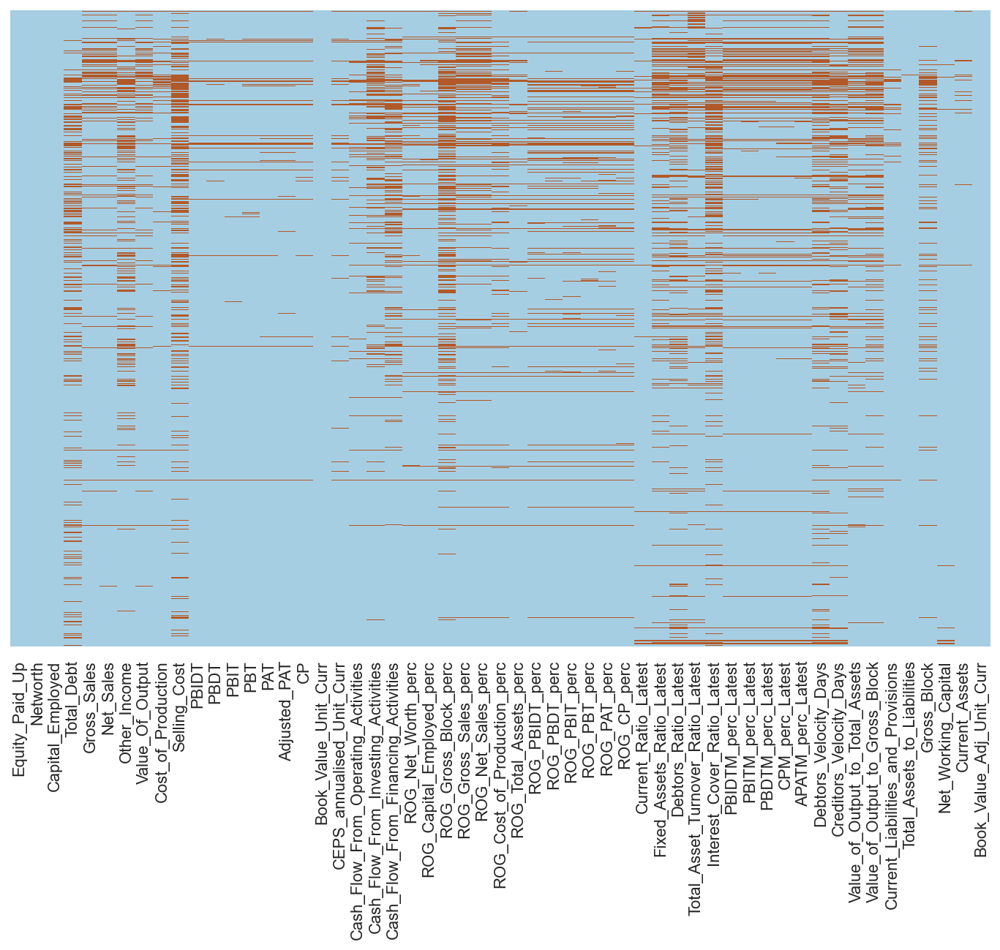

In [23]:
plt.figure(figsize = (12,8))
sns.heatmap(df1.isnull(), cbar = False, cmap = 'Paired', yticklabels = False)
plt.show();

In [24]:
df1['default'] = df['default']
df_rows = df1[df1.isna().sum(axis=1)>5]
df_rows.shape

(1004, 56)

In [25]:
df1['default'].value_counts()

0    3199
1     387
Name: default, dtype: int64

In [26]:
df_rows['default'].value_counts()

0    840
1    164
Name: default, dtype: int64

In [27]:
df_x = df1.drop('default', axis=1)
df_y = df1['default']

In [28]:
df1.isna().sum()

Equity_Paid_Up                            1
Networth                                  3
Capital_Employed                          5
Total_Debt                              844
Gross_Sales                             305
Net_Sales                               306
Other_Income                            690
Value_Of_Output                         290
Cost_of_Production                      159
Selling_Cost                            938
PBIDT                                   102
PBDT                                    108
PBIT                                    109
PBT                                     119
PAT                                     121
Adjusted_PAT                            124
CP                                      111
Book_Value_Unit_Curr                      1
CEPS_annualised_Unit_Curr               139
Cash_Flow_From_Operating_Activities     180
Cash_Flow_From_Investing_Activities     510
Cash_Flow_From_Financing_Activities     656
ROG_Net_Worth_perc              

In [29]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)

df_imputed = pd.DataFrame(imputer.fit_transform(df1), columns = df1.columns)

df_imputed.isnull().sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

In [30]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [31]:
df_x = df_imputed.drop('default', axis=1)
df_y = df_imputed['default']

In [32]:
for column in df_x.columns:
    lr,ur=remove_outlier(df_x[column])
    df_x[column]=np.where(df_x[column]>ur,ur,df_x[column])
    df_x[column]=np.where(df_x[column]<lr,lr,df_x[column])

In [33]:
df = pd.concat([df_x, df_y], axis = 1)

In [34]:
df.shape

(3586, 56)

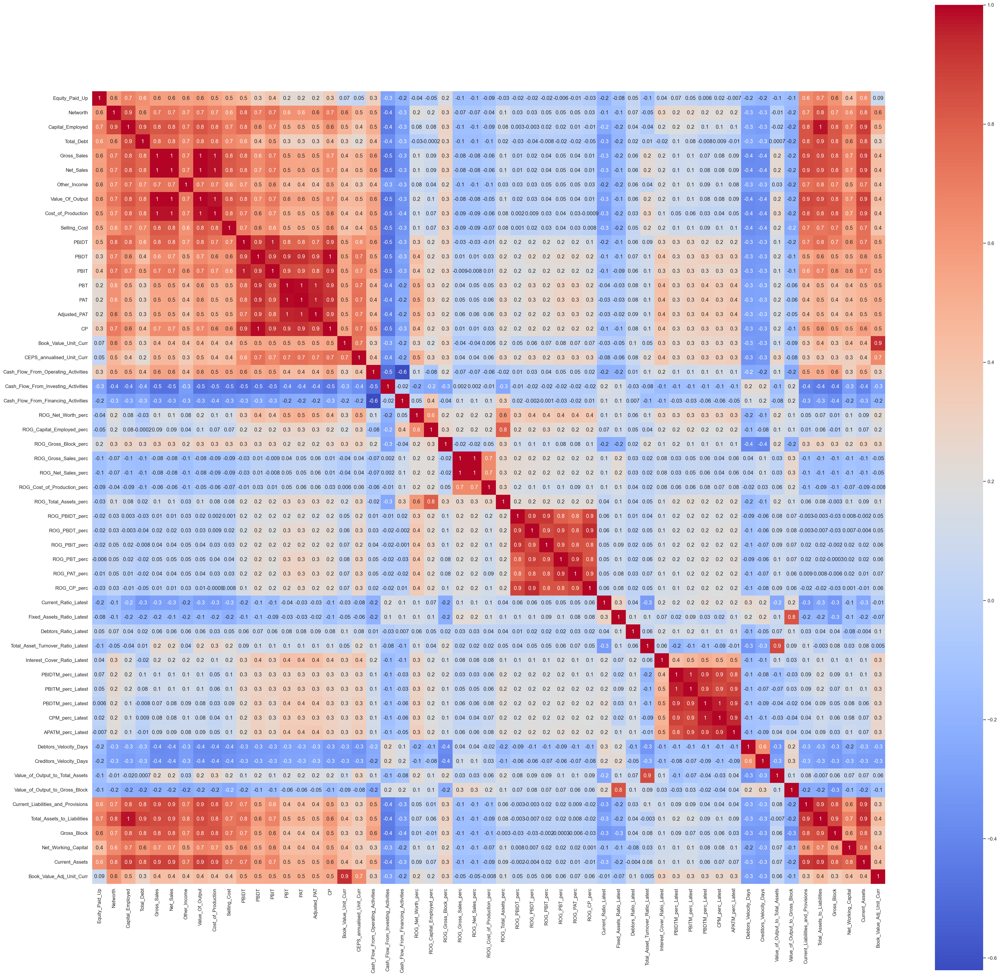

In [35]:
#calculate column correlations and make a seaborn heatmap - Before standardisation

plt.figure(figsize=(40,40))
p=sns.heatmap(df_x.corr(), annot=True,cmap='coolwarm',square=True, fmt='.1g')

In [36]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [37]:
X = df_x.copy()
f = calc_vif(X).sort_values(by = 'VIF', ascending = False)
f

,variables,VIF
5,Net_Sales,1155.479289
25,ROG_Gross_Sales_perc,990.784386
26,ROG_Net_Sales_perc,989.280569
4,Gross_Sales,692.791960
7,Value_Of_Output,475.547298
11,PBDT,118.320353
50,Total_Assets_to_Liabilities,106.812670
16,CP,104.422022
14,PAT,76.554676
13,PBT,75.937631


In [38]:
X.shape
X.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

In [39]:
import time
start = time.time()

for i in range(55):
    v = calc_vif(X).sort_values(by = 'VIF', ascending = False)
    if (v.iloc[0,1] > 5):
        X = X.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 22.41885805130005


In [40]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
1,Total_Debt,4.894654
5,CEPS_annualised_Unit_Curr,4.441096
3,Selling_Cost,4.129128
10,ROG_Capital_Employed_perc,3.859918
0,Equity_Paid_Up,3.751747
2,Other_Income,3.644490
6,Cash_Flow_From_Operating_Activities,3.576169
26,Book_Value_Adj_Unit_Curr,3.363715
14,ROG_Total_Assets_perc,3.326385
4,Adjusted_PAT,3.279813


In [41]:
X.shape
X.head()

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,43.16875,220.71875,7.600,0.49200,-8.36,-13.175,-19.9575,1.46000,12.044375,-15.310000,-20.76,-9.75,-19.071000,1.38,-25.75,5.23000,-19.3300,0.02,7.075,1.328,-0.20,-24.496875,284.800,153.1,6.97,-92.37375,-72.365
1,43.16875,220.71875,9.602,11.90625,-8.36,-0.020,32.3025,-13.43375,12.044375,-25.214375,6.30,3.17,5.920000,13.16,6.66,5.24000,-9.8500,0.08,10.350,0.300,-0.84,-24.496875,29.000,101.0,0.24,-92.37375,-15.180
2,43.16875,220.71875,9.550,11.90625,-8.36,-13.175,-19.9575,-13.43375,12.044375,-25.214375,15.66,-2.07,-75.870000,-69.93,-0.78,-159.95625,-244.9875,1.06,0.420,0.287,-2.21,-24.496875,97.000,558.0,-0.26,156.79625,94.140
3,43.16875,220.71875,9.602,3.34000,-8.36,-13.175,32.3025,8.39625,-16.774625,-25.214375,-31.84,-1.80,8.330000,16.59,-10.12,-159.95625,-80.2300,0.09,9.260,0.602,-0.16,-24.496875,93.000,63.0,1.90,-92.37375,-39.640
4,43.16875,220.71875,9.602,1.97000,-8.36,-13.175,-19.9575,8.39625,12.044375,-25.214375,-11.76,0.34,-78.725625,-48.80,-5.81,-40.07000,1.8700,0.50,1.280,0.010,-0.73,29.042125,741.375,346.0,0.05,156.79625,-72.365


In [42]:
sc = StandardScaler()
scaled_x = pd.DataFrame(sc.fit_transform(X), columns=X.columns)
scaled_x.shape
scaled_x.head()

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,2.083934,1.983979,1.386708,-0.576680,-1.677338,-1.997348,-1.824762,0.647296,1.684582,-1.198860,-1.381623,-0.159197,-0.716531,-0.284501,-1.719517,-0.070905,-0.186899,-1.122947,-0.279521,0.220992,-0.627646,-1.663614,0.213101,-0.175320,-0.036951,-2.122059,-2.204582
1,2.083934,1.983979,1.942253,1.951643,-1.677338,-0.538480,1.785208,-1.756109,1.684582,-1.794636,0.053718,0.260468,-0.202754,-0.022227,0.096606,-0.070793,-0.113376,-1.093242,0.071760,-0.745540,-0.721072,-1.663614,-0.730131,-0.395560,-0.810397,-2.122059,-1.063848
2,2.083934,1.983979,1.927823,1.951643,-1.677338,-1.997348,-1.824762,-1.756109,1.684582,-1.794636,0.550199,0.090263,-1.884232,-1.872171,-0.320301,-1.916753,-1.937016,-0.608063,-0.993346,-0.757763,-0.921061,-1.663614,-0.479389,1.536300,-0.867860,1.916351,1.116881
3,2.083934,1.983979,1.942253,0.054169,-1.677338,-1.997348,1.785208,1.766599,-1.730935,-1.794636,-1.969338,0.099033,-0.153208,0.054140,-0.843676,-1.916753,-0.659217,-1.088291,-0.045155,-0.461598,-0.621807,-1.663614,-0.494138,-0.556196,-0.619621,-2.122059,-1.551780
4,2.083934,1.983979,1.942253,-0.249294,-1.677338,-1.997348,-1.824762,1.766599,1.684582,-1.794636,-0.904237,0.168544,-1.942939,-1.401725,-0.602161,-0.577103,-0.022479,-0.885308,-0.901101,-1.018200,-0.705014,1.793199,1.896668,0.640120,-0.832233,1.916351,-2.204582


In [43]:
df_1 = pd.concat([scaled_x, df_y], axis=1)
df_1.head()

,Equity_Paid_Up,Total_Debt,Other_Income,Selling_Cost,Adjusted_PAT,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,Current_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr,default
0,2.083934,1.983979,1.386708,-0.576680,-1.677338,-1.997348,-1.824762,0.647296,1.684582,-1.198860,-1.381623,-0.159197,-0.716531,-0.284501,-1.719517,-0.070905,-0.186899,-1.122947,-0.279521,0.220992,-0.627646,-1.663614,0.213101,-0.175320,-0.036951,-2.122059,-2.204582,1.0
1,2.083934,1.983979,1.942253,1.951643,-1.677338,-0.538480,1.785208,-1.756109,1.684582,-1.794636,0.053718,0.260468,-0.202754,-0.022227,0.096606,-0.070793,-0.113376,-1.093242,0.071760,-0.745540,-0.721072,-1.663614,-0.730131,-0.395560,-0.810397,-2.122059,-1.063848,1.0
2,2.083934,1.983979,1.927823,1.951643,-1.677338,-1.997348,-1.824762,-1.756109,1.684582,-1.794636,0.550199,0.090263,-1.884232,-1.872171,-0.320301,-1.916753,-1.937016,-0.608063,-0.993346,-0.757763,-0.921061,-1.663614,-0.479389,1.536300,-0.867860,1.916351,1.116881,1.0
3,2.083934,1.983979,1.942253,0.054169,-1.677338,-1.997348,1.785208,1.766599,-1.730935,-1.794636,-1.969338,0.099033,-0.153208,0.054140,-0.843676,-1.916753,-0.659217,-1.088291,-0.045155,-0.461598,-0.621807,-1.663614,-0.494138,-0.556196,-0.619621,-2.122059,-1.551780,1.0
4,2.083934,1.983979,1.942253,-0.249294,-1.677338,-1.997348,-1.824762,1.766599,1.684582,-1.794636,-0.904237,0.168544,-1.942939,-1.401725,-0.602161,-0.577103,-0.022479,-0.885308,-0.901101,-1.018200,-0.705014,1.793199,1.896668,0.640120,-0.832233,1.916351,-2.204582,1.0


In [44]:
df_1.shape

(3586, 28)

In [45]:
X_train, X_test, y_train, y_test = train_test_split(scaled_x, df_y, test_size = 0.33, random_state=42)

In [46]:
df1_train = pd.concat([X_train, y_train], axis=1)

In [47]:
scaled_x.columns

Index(['Equity_Paid_Up', 'Total_Debt', 'Other_Income', 'Selling_Cost', 'Adjusted_PAT', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBT_perc', 'Current_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days', 'Value_of_Output_to_Gross_Block', 'Net_Working_Capital', 'Book_Value_Adj_Unit_Curr'], dtype='object')

In [48]:
scaled_x.shape

(3586, 27)

In [49]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_1 = SM.Logit(y_train, X_train).fit()
print(model_1.summary())

Optimization terminated successfully.
         Current function value: 0.616807
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2375
Method:                           MLE   Df Model:                           26
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                 -0.8722
Time:                        14:40:32   Log-Likelihood:                -1481.6
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Equity_Paid_Up                         -0.1875      0.064 

              precision    recall  f1-score   support

         0.0       1.00      0.60      0.75      2157
         1.0       0.22      0.98      0.36       245

    accuracy                           0.64      2402
   macro avg       0.61      0.79      0.55      2402
weighted avg       0.92      0.64      0.71      2402



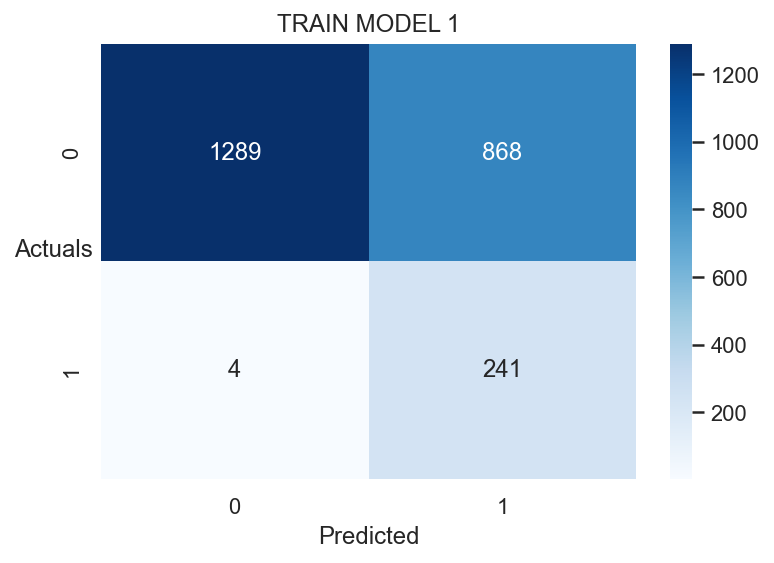

In [50]:
## MODEL 1 TRAIN

y_prob_pred_train = model_1.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 1')

print(metrics.classification_report(y_train,y_class_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.55      0.71      1042
         1.0       0.23      0.99      0.38       142

    accuracy                           0.61      1184
   macro avg       0.62      0.77      0.54      1184
weighted avg       0.91      0.61      0.67      1184



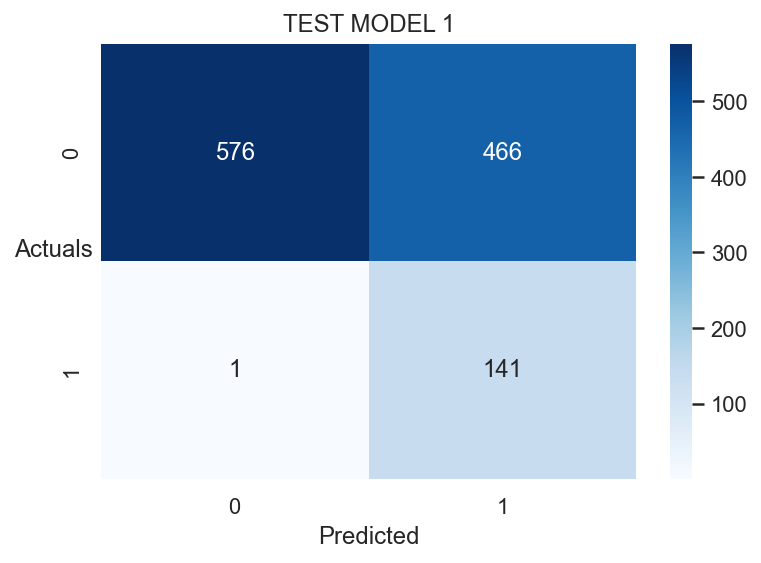

In [51]:
## MODEL 2 TEST

y_prob_pred_test = model_1.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 1')

print(metrics.classification_report(y_test,y_class_pred))

In [52]:
X_test.shape

(1184, 27)

In [53]:
v = pd.DataFrame(model_1.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
v

,index,pvalue
0,ROG_Cost_of_Production_perc,8.211513e-01
1,Cash_Flow_From_Investing_Activities,7.988386e-01
2,Value_of_Output_to_Gross_Block,7.939213e-01
3,ROG_Net_Sales_perc,7.699661e-01
4,Interest_Cover_Ratio_Latest,7.257786e-01
5,Selling_Cost,7.048800e-01
6,Adjusted_PAT,6.225951e-01
7,ROG_Capital_Employed_perc,5.917661e-01
8,Debtors_Ratio_Latest,5.710823e-01
9,Total_Asset_Turnover_Ratio_Latest,4.287622e-01


In [54]:
import time
start = time.time()

for i in range(25):
    model_2 = SM.Logit(y_train, X_train).fit()
    v = pd.DataFrame(model_2.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_train = X_train.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.616807
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616818
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616826
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616838
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616857
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616879
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616904
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.616957
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617013
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.617085
  

In [55]:
print(model_2.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2392
Method:                           MLE   Df Model:                            9
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                 -0.8827
Time:                        14:40:33   Log-Likelihood:                -1489.9
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Equity_Paid_Up              -0.2211      0.060     -3.655      0.000      -0.340      -0.103
Total_Debt                   0.3199      0.078      4.086      0.000       0.166       0.

In [56]:
X_train.shape

(2402, 10)

In [57]:
y_train.shape

(2402,)

In [58]:
X_test = X_test[X_train.columns]
X_test.shape

(1184, 10)

In [59]:
X_test.columns

Index(['Equity_Paid_Up', 'Total_Debt', 'Other_Income', 'ROG_Net_Worth_perc', 'ROG_PBIDT_perc', 'ROG_PBT_perc', 'Current_Ratio_Latest', 'APATM_perc_Latest', 'Net_Working_Capital', 'Book_Value_Adj_Unit_Curr'], dtype='object')

              precision    recall  f1-score   support

         0.0       1.00      0.59      0.74      2157
         1.0       0.21      0.98      0.35       245

    accuracy                           0.63      2402
   macro avg       0.61      0.79      0.55      2402
weighted avg       0.92      0.63      0.70      2402



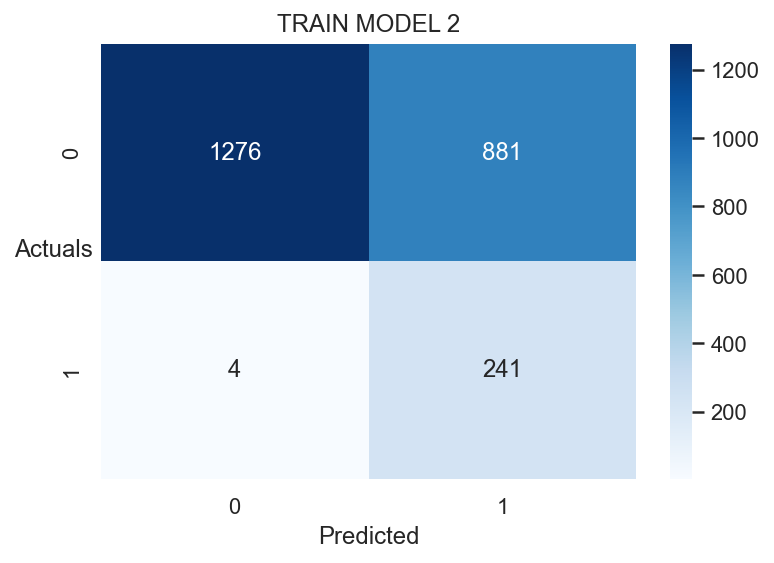

In [60]:
## MODEL 2 TRAIN

y_prob_pred_train = model_2.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 2')

print(metrics.classification_report(y_train,y_class_pred))

              precision    recall  f1-score   support

         0.0       1.00      0.54      0.70      1042
         1.0       0.23      0.99      0.37       142

    accuracy                           0.60      1184
   macro avg       0.61      0.77      0.54      1184
weighted avg       0.90      0.60      0.66      1184



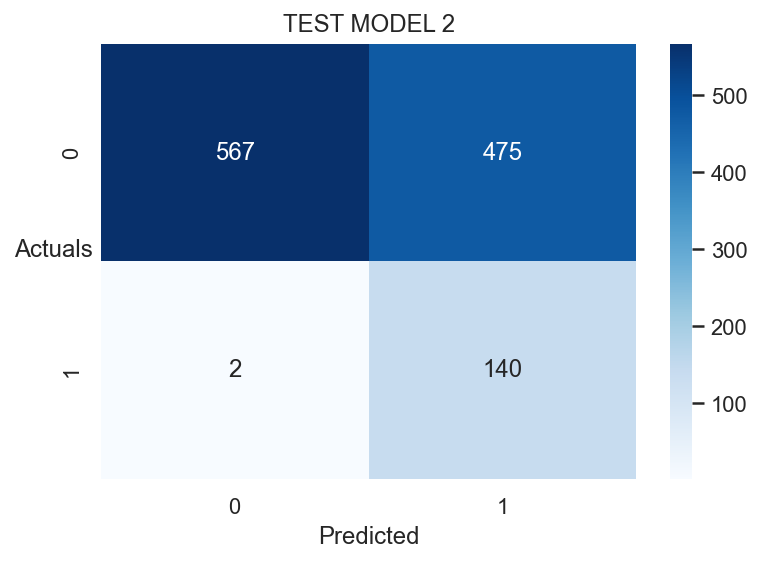

In [61]:
## MODEL 2 TEST

y_prob_pred_test = model_2.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 2')

print(metrics.classification_report(y_test,y_class_pred))

In [62]:
df = pd.read_excel('Company_Data2015-1.xlsx')
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Gross Sales,Net Sales,Other Income,Value Of Output,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted PAT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Market Capitalisation,CEPS (annualised) (Unit Curr),Cash Flow From Operating Activities,Cash Flow From Investing Activities,Cash Flow From Financing Activities,ROG-Net Worth (%),ROG-Capital Employed (%),ROG-Gross Block (%),ROG-Gross Sales (%),ROG-Net Sales (%),ROG-Cost of Production (%),ROG-Total Assets (%),ROG-PBIDT (%),ROG-PBDT (%),ROG-PBIT (%),ROG-PBT (%),ROG-PAT (%),ROG-CP (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Total Asset Turnover Ratio[Latest],Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [63]:
df.columns = df.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('%', 'perc').str.replace('/', '_to_').str.replace('[', '_').str.replace(']', '').str.replace('-', '_')

In [64]:
df['Current_Liabilities_and_Provisions'] = df['Current_Liabilities_and_Provisions_']
df['Total_Assets_to_Liabilities'] = df['Total_Assets_to_Liabilities_']
df['Gross_Block'] = df['Gross_Block_']
df['Net_Working_Capital'] = df['Net_Working_Capital_']
df['Current_Assets'] = df['Current_Assets_']
df['Book_Value_Adj_Unit_Curr'] = df['Book_Value_Adj._Unit_Curr']

In [65]:
df.drop(['Current_Liabilities_and_Provisions_', 'Total_Assets_to_Liabilities_', 'Gross_Block_', 'Net_Working_Capital_', 'Current_Assets_', 'Book_Value_Adj._Unit_Curr'], axis=1, inplace=True)

In [67]:
print('Number of Rows (Companies) =', df.shape[0])
print('Number of Columns (Variables) =', df.shape[1])

Number of Rows (Companies) = 3586
Number of Columns (Variables) = 67


In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth_Next_Year                   3586 non-null   float64
 3   Equity_Paid_Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital_Employed                     3586 non-null   float64
 6   Total_Debt                           3586 non-null   float64
 7   Gross_Sales                          3586 non-null   float64
 8   Net_Sales                            3586 non-null   float64
 9   Other_Income                         3586 non-null   float64
 10  Value_Of_Output                      3586 non-null   float64
 11  Cost_of_Production            

In [69]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,16065.388734,19776.817379,4.00,3029.2500,6077.500,24269.5000,72493.00
Networth_Next_Year,3586.0,725.045251,4769.681004,-8021.60,3.9850,19.015,123.8025,111729.10
Equity_Paid_Up,3586.0,62.966584,778.761744,0.00,3.7500,8.290,19.5175,42263.46
Networth,3586.0,649.746299,4091.988792,-7027.48,3.8925,18.580,117.2975,81657.35
Capital_Employed,3586.0,2799.611054,26975.135385,-1824.75,7.6025,39.090,226.6050,714001.25
Total_Debt,3586.0,1994.823779,23652.842746,-0.72,0.0300,7.490,72.3500,652823.81
Gross_Sales,3586.0,1123.738985,10603.703837,-62.59,1.4425,31.210,242.2500,474182.94
Net_Sales,3586.0,1079.702579,9996.574173,-62.59,1.4400,30.440,234.4400,443775.16
Other_Income,3586.0,48.729824,426.040665,-448.72,0.0200,0.450,3.6350,14143.40
Value_Of_Output,3586.0,1077.187292,9843.880293,-119.10,1.4125,30.895,235.8375,435559.09


In [70]:
print('Number of Duplicates =', df.duplicated().sum().sum())

Number of Duplicates = 0


In [71]:
df.drop(['Co_Code', 'Co_Name'], axis=1, inplace=True)
df.head()

,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18
2,-3192.58,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14
3,-3054.51,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64
4,-2967.36,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89


In [73]:
df_orig = df.copy()
df['default'] = np.where(df['Networth_Next_Year']>=0, 0, 1)
df[['default', 'Networth_Next_Year']].head()

,default,Networth_Next_Year
0,1,-8021.60
1,1,-3986.19
2,1,-3192.58
3,1,-3054.51
4,1,-2967.36


In [74]:
df[['default', 'Networth_Next_Year']].tail()

,default,Networth_Next_Year
3581,0,72677.77
3582,0,79162.19
3583,0,88134.31
3584,0,91293.70
3585,0,111729.10


In [75]:
df.drop('Networth_Next_Year', axis=1, inplace=True)
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Revenue_earnings_in_forex,Revenue_expenses_in_forex,Capital_expenses_in_forex,Book_Value_Unit_Curr,Market_Capitalisation,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,ROG_Revenue_earnings_in_forex_perc,ROG_Revenue_expenses_in_forex_perc,ROG_Market_Capitalisation_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Inventory_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr,default
0,419.36,-7027.48,-1007.24,5936.03,0.00,0.00,7.60,-0.07,137.67,0.00,-179.06,-926.52,-185.53,-932.99,-932.99,-937.85,-926.52,0.00,0.00,0.00,-167.58,0.00,-22.09,-102.47,1.46,92.58,-15.31,-20.76,-9.75,0.00,0.00,1.38,-25.75,5.23,-19.29,4.43,-19.33,-19.33,-19.29,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00,1116.85,109.60,474.30,-1076.34,40.50,-167.58,1
1,1954.93,-2968.08,4458.20,7410.18,2892.73,2892.73,46.27,2900.71,2572.46,40.51,646.46,-4.32,35.53,-615.25,-615.25,-617.14,-4.32,6.35,143.42,141.17,-15.18,1544.39,-0.02,635.91,-785.00,176.93,-26.15,6.30,3.17,5.92,5.92,13.16,6.66,5.24,-108.77,614.89,-9.85,-9.85,-108.77,1.93,34.00,6.61,0.08,0.25,804.44,10.35,0.30,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24,1585.74,6043.94,9070.86,-1098.88,486.86,-15.18,1
2,53.84,506.86,7714.68,6944.54,392.13,392.13,9.55,301.16,408.51,54.83,-281.92,-1086.71,-381.10,-1185.89,-897.70,-873.39,-798.52,0.00,86.36,2.27,94.14,1220.81,-148.31,-873.40,-458.27,1187.51,-61.86,15.66,-2.07,-75.87,-75.87,-69.93,-0.78,-169.69,-431.68,-221.85,-300.41,-350.43,-642.67,-100.00,-81.21,-6.31,1.06,0.03,0.01,0.42,0.00,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26,4601.39,12316.07,1281.54,4496.25,9097.64,94.14,1
3,157.30,-623.49,2353.88,2326.05,1354.39,1354.39,223.85,1350.14,1326.99,3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-770.18,-677.57,0.89,28.88,0.00,-39.64,194.27,-43.08,324.47,17.31,-412.55,-450.67,-40.84,-1.80,8.33,8.33,16.59,-10.12,-203.84,-102.72,-455.28,-80.23,-70.57,-88.52,-52.91,-33.85,-13.94,0.09,5.08,411.15,9.26,0.00,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90,3646.54,6000.42,1033.69,-2612.42,1034.12,-39.64,1
4,50.30,-1070.83,4675.33,5740.90,38.72,38.72,9.82,38.72,186.29,1.97,-647.86,-944.42,-710.13,-1006.69,-864.58,-327.77,-802.31,0.00,15.62,0.00,-212.89,113.68,-159.50,-191.54,61.34,143.65,-559.83,-11.76,0.34,-80.61,-80.61,-48.80,-5.81,-40.07,3.28,-38.72,1.87,-2.59,-1.13,-100.00,-91.17,-12.91,0.50,0.05,0.02,1.28,0.01,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05,2849.58,7524.91,1084.20,1836.23,4685.81,-212.89,1


In [77]:
print('MISSING VALUES PER VARIABLE:')
print('')
df.isnull().sum()

MISSING VALUES PER VARIABLE:



Equity_Paid_Up                           0
Networth                                 0
Capital_Employed                         0
Total_Debt                               0
Gross_Sales                              0
Net_Sales                                0
Other_Income                             0
Value_Of_Output                          0
Cost_of_Production                       0
Selling_Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted_PAT                             0
CP                                       0
Revenue_earnings_in_forex                0
Revenue_expenses_in_forex                0
Capital_expenses_in_forex                0
Book_Value_Unit_Curr                     0
Market_Capitalisation                    0
CEPS_annualised_Unit_Curr                0
Cash_Flow_F

In [78]:
print('PERCENT OF MISSING VALUES TO THE WHOLE DATA:')
print('')
round(df.isna().sum()*100/df.shape[0], 2)

PERCENT OF MISSING VALUES TO THE WHOLE DATA:



Equity_Paid_Up                         0.00
Networth                               0.00
Capital_Employed                       0.00
Total_Debt                             0.00
Gross_Sales                            0.00
Net_Sales                              0.00
Other_Income                           0.00
Value_Of_Output                        0.00
Cost_of_Production                     0.00
Selling_Cost                           0.00
PBIDT                                  0.00
PBDT                                   0.00
PBIT                                   0.00
PBT                                    0.00
PAT                                    0.00
Adjusted_PAT                           0.00
CP                                     0.00
Revenue_earnings_in_forex              0.00
Revenue_expenses_in_forex              0.00
Capital_expenses_in_forex              0.00
Book_Value_Unit_Curr                   0.00
Market_Capitalisation                  0.00
CEPS_annualised_Unit_Curr       

In [79]:
(df.drop('default', axis=1)==0).sum().sort_values(ascending=False)

Capital_expenses_in_forex              2892
ROG_Revenue_earnings_in_forex_perc     2269
Revenue_earnings_in_forex              2230
ROG_Revenue_expenses_in_forex_perc     1971
Revenue_expenses_in_forex              1909
ROG_Market_Capitalisation_perc         1422
Market_Capitalisation                  1249
Inventory_Velocity_Days                1123
Inventory_Ratio_Latest                 1100
Interest_Cover_Ratio_Latest            1001
ROG_Gross_Block_perc                    940
Selling_Cost                            938
Total_Debt                              844
Debtors_Ratio_Latest                    745
Debtors_Velocity_Days                   729
Creditors_Velocity_Days                 704
Other_Income                            690
Cash_Flow_From_Financing_Activities     656
Value_of_Output_to_Gross_Block          611
Fixed_Assets_Ratio_Latest               607
Cash_Flow_From_Investing_Activities     510
Total_Asset_Turnover_Ratio_Latest       493
Value_of_Output_to_Total_Assets 

In [80]:
round(((df.drop('default', axis=1)==0).sum())*100/df.shape[0], 2).sort_values(ascending=False)

Capital_expenses_in_forex              80.65
ROG_Revenue_earnings_in_forex_perc     63.27
Revenue_earnings_in_forex              62.19
ROG_Revenue_expenses_in_forex_perc     54.96
Revenue_expenses_in_forex              53.23
ROG_Market_Capitalisation_perc         39.65
Market_Capitalisation                  34.83
Inventory_Velocity_Days                31.32
Inventory_Ratio_Latest                 30.67
Interest_Cover_Ratio_Latest            27.91
ROG_Gross_Block_perc                   26.21
Selling_Cost                           26.16
Total_Debt                             23.54
Debtors_Ratio_Latest                   20.78
Debtors_Velocity_Days                  20.33
Creditors_Velocity_Days                19.63
Other_Income                           19.24
Cash_Flow_From_Financing_Activities    18.29
Value_of_Output_to_Gross_Block         17.04
Fixed_Assets_Ratio_Latest              16.93
Cash_Flow_From_Investing_Activities    14.22
Total_Asset_Turnover_Ratio_Latest      13.75
Value_of_O

In [81]:
df.drop(['Capital_expenses_in_forex', 'ROG_Revenue_earnings_in_forex_perc', 'Revenue_earnings_in_forex', 'ROG_Revenue_expenses_in_forex_perc', 'Revenue_expenses_in_forex', 'ROG_Market_Capitalisation_perc', 'Market_Capitalisation', 'Inventory_Velocity_Days', 'Inventory_Ratio_Latest'], axis=1, inplace=True)
df.shape

(3586, 56)

In [82]:
df.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

In [84]:
df1 = df.drop('default', axis=1)
df1[df1==0] = np.nan
(df1==0).sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

In [86]:
(df1==0).shape

(3586, 55)

In [87]:
df1.shape

(3586, 55)

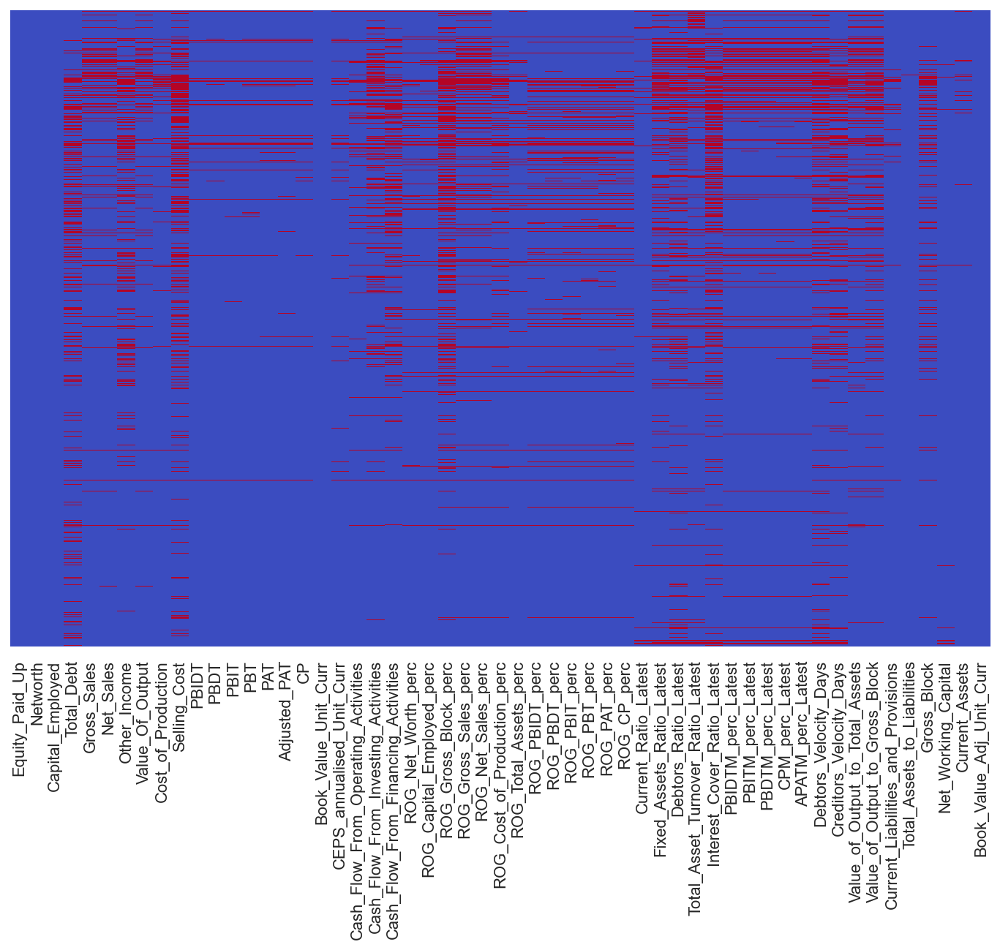

In [88]:
plt.figure(figsize = (12,8))
sns.heatmap(df1.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show();

In [89]:
df1['default'] = df['default']
df_rows = df1[df1.isna().sum(axis=1)>5]
df_rows.shape

(1004, 56)

In [90]:
df1['default'].value_counts()

0    3199
1     387
Name: default, dtype: int64

In [91]:
df_rows['default'].value_counts()

0    840
1    164
Name: default, dtype: int64

In [93]:
df_x = df1.drop('default', axis=1)
df_y = df1['default']

In [94]:
df1.isna().sum()

Equity_Paid_Up                            1
Networth                                  3
Capital_Employed                          5
Total_Debt                              844
Gross_Sales                             305
Net_Sales                               306
Other_Income                            690
Value_Of_Output                         290
Cost_of_Production                      159
Selling_Cost                            938
PBIDT                                   102
PBDT                                    108
PBIT                                    109
PBT                                     119
PAT                                     121
Adjusted_PAT                            124
CP                                      111
Book_Value_Unit_Curr                      1
CEPS_annualised_Unit_Curr               139
Cash_Flow_From_Operating_Activities     180
Cash_Flow_From_Investing_Activities     510
Cash_Flow_From_Financing_Activities     656
ROG_Net_Worth_perc              

In [95]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=10)

df_imputed = pd.DataFrame(imputer.fit_transform(df1), columns = df1.columns)

df_imputed.isnull().sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
Cash_Flow_From_Operating_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Financing_Activities    0
ROG_Net_Worth_perc                     0
ROG_Capital_Employed_perc              0
ROG_Gross_Block_

In [96]:
df_x = df_imputed.drop('default', axis=1)
df_y = df_imputed['default']

In [97]:
sc = StandardScaler()
scaled_x = pd.DataFrame(sc.fit_transform(df_x), columns=df_x.columns)
scaled_x.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Sales,Net_Sales,Other_Income,Value_Of_Output,Cost_of_Production,Selling_Cost,PBIDT,PBDT,PBIT,PBT,PAT,Adjusted_PAT,CP,Book_Value_Unit_Curr,CEPS_annualised_Unit_Curr,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Gross_Sales_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBDT_perc,ROG_PBIT_perc,ROG_PBT_perc,ROG_PAT_perc,ROG_CP_perc,Current_Ratio_Latest,Fixed_Assets_Ratio_Latest,Debtors_Ratio_Latest,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Velocity_Days,Creditors_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Current_Liabilities_and_Provisions,Total_Assets_to_Liabilities,Gross_Block,Net_Working_Capital,Current_Assets,Book_Value_Adj_Unit_Curr
0,0.457700,-1.876422,-0.141144,0.164945,-0.104687,-0.106625,-0.098359,-0.109951,-0.073220,-0.136621,-0.219745,-1.087986,-0.218400,-1.269925,-1.597444,-1.712733,-1.300665,-0.200218,-0.070167,-0.116234,0.088901,0.063686,-0.031174,-0.024154,-0.053997,-0.047697,-0.047683,-0.061476,-0.022530,-0.016883,-0.018319,-0.017542,-0.013260,-0.010295,-0.017847,-0.114195,-0.080782,-0.064401,-0.005841,-0.073199,0.009095,0.019901,0.026778,0.026680,0.026341,-0.064421,-0.048858,-0.003375,-0.062919,0.271003,-0.145930,-0.024689,-0.239493,-0.085048,-0.018786
1,2.429785,-0.884247,0.061494,0.227253,0.166239,0.180775,-0.007957,0.184665,0.195001,0.068248,0.203293,-0.127132,-0.099064,-0.874320,-1.087414,-1.162821,-0.124049,-0.106285,-0.043523,0.390891,-1.031616,0.129995,-0.031439,-0.023940,-0.039885,-0.043602,-0.043588,-0.059370,-0.022273,-0.016883,-0.022694,0.009504,-0.012780,-0.009595,-0.024217,-0.113642,-0.089792,-0.057742,-0.394148,-0.074904,0.025142,0.025454,0.025275,0.025471,0.024367,-0.088268,-0.049809,-0.511823,-0.069802,0.446313,0.372988,1.740220,-0.242617,-0.065275,-0.017597
2,-0.011726,-0.034923,0.182233,0.207572,-0.069530,-0.069321,-0.093800,-0.079357,-0.043384,0.141558,-0.272456,-1.254890,-0.323976,-1.584800,-1.540797,-1.602205,-1.137352,-0.038905,-0.222551,-0.645714,-0.566104,0.924426,-0.032309,-0.023866,-0.045608,-0.057003,-0.056989,-0.074224,-0.022332,-0.024361,-0.038483,-0.027567,-0.027490,-0.034743,-0.062224,-0.104608,-0.090114,-0.077933,-0.399059,-0.078552,-2.906883,-1.760436,-0.679169,-0.689945,-0.603131,-0.081929,-0.041464,-0.799464,-0.070313,1.573817,0.921444,0.141041,0.532734,0.316165,-0.016744
3,0.121144,-0.311197,-0.016526,0.012361,0.021196,0.026919,0.407187,0.027182,0.057797,-0.122041,-0.237143,-0.828601,-0.300023,-1.105950,-1.386042,-1.425234,-0.983034,-0.121361,-0.095508,0.176992,0.111484,-0.333403,-0.041781,-0.024313,-0.045313,-0.043207,-0.043193,-0.058757,-0.022406,-0.025821,-0.022398,-0.037909,-0.016343,-0.014078,-0.022775,-0.113550,-0.082719,-0.059959,-0.280074,-0.073092,0.029020,0.036061,0.026151,0.026408,0.027204,-0.082302,-0.050503,-0.571043,-0.068104,1.216814,0.369183,0.090156,-0.452357,-0.041032,-0.017788
4,-0.016273,-0.420533,0.069545,0.156697,-0.102851,-0.104667,-0.093169,-0.106012,-0.067864,-0.129055,-0.459983,-1.106636,-0.501598,-1.361685,-1.487634,-0.666646,-1.142188,-0.228145,-0.236060,-0.177408,0.174216,0.103833,-0.044441,-0.024083,-0.042976,-0.057780,-0.057766,-0.070447,-0.022372,-0.018820,-0.017215,-0.019453,-0.012187,-0.009059,-0.016554,-0.109770,-0.090085,-0.076184,-0.503690,-0.074611,-0.133595,-0.092190,-0.046619,0.066303,0.053212,0.271397,-0.045336,-0.765624,-0.069996,0.918843,0.502489,0.100526,0.164119,0.120730,-0.019139


In [98]:
for column in df_x.columns:
    lr = -3
    ur = 3
    df_x[column]=np.where(df_x[column]>ur,ur,df_x[column])
    df_x[column]=np.where(df_x[column]<lr,lr,df_x[column])

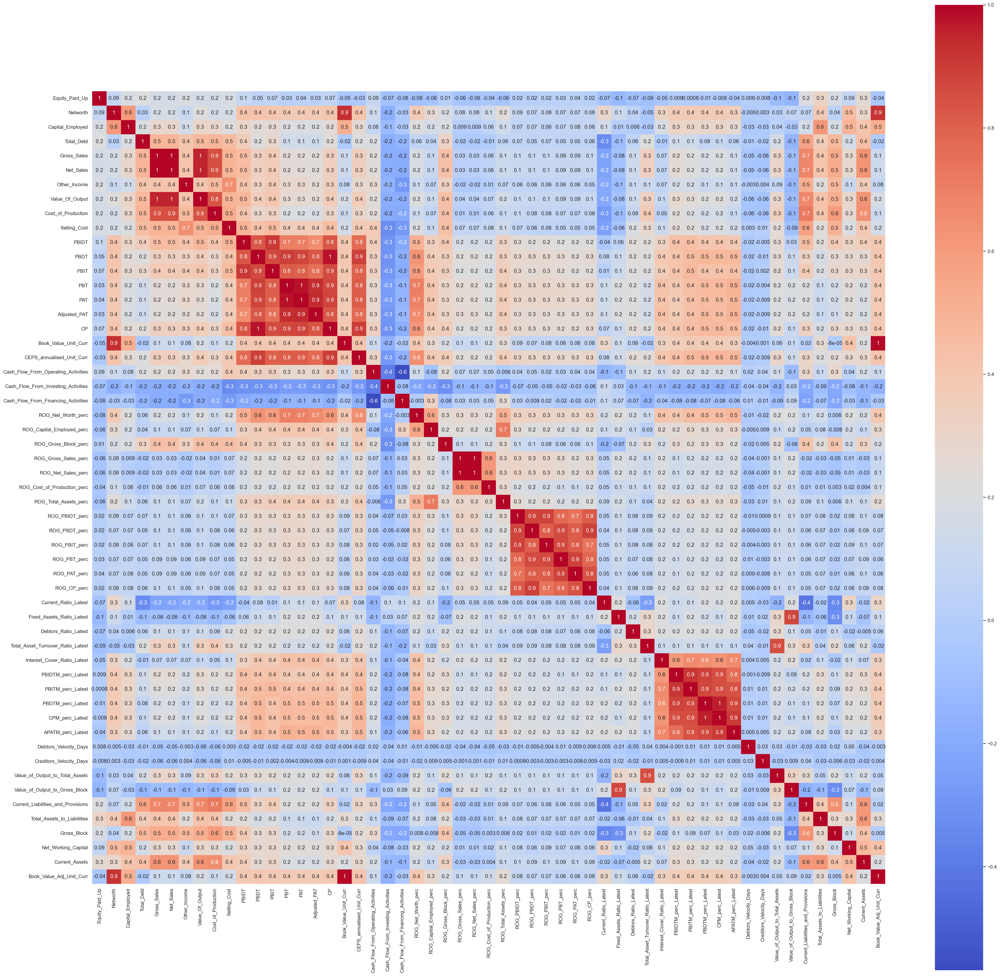

In [99]:
#calculate column correlations and make a seaborn heatmap - Before standardisation

plt.figure(figsize=(40,40))
p=sns.heatmap(df_x.corr(), annot=True,cmap='coolwarm',square=True, fmt='.1g')

In [100]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [101]:
X = df_x.copy()
f = calc_vif(X).sort_values(by = 'VIF', ascending = False)
f

,variables,VIF
5,Net_Sales,91096.145862
4,Gross_Sales,90763.926316
17,Book_Value_Unit_Curr,201.523094
54,Book_Value_Adj_Unit_Curr,189.628506
45,Debtors_Velocity_Days,140.189690
46,Creditors_Velocity_Days,136.567955
25,ROG_Gross_Sales_perc,106.347196
26,ROG_Net_Sales_perc,106.298466
7,Value_Of_Output,73.148662
50,Total_Assets_to_Liabilities,65.545310


In [102]:
X.columns

Index(['Equity_Paid_Up', 'Networth', 'Capital_Employed', 'Total_Debt', 'Gross_Sales', 'Net_Sales', 'Other_Income', 'Value_Of_Output', 'Cost_of_Production', 'Selling_Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'Book_Value_Unit_Curr', 'CEPS_annualised_Unit_Curr', 'Cash_Flow_From_Operating_Activities', 'Cash_Flow_From_Investing_Activities', 'Cash_Flow_From_Financing_Activities', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Gross_Sales_perc', 'ROG_Net_Sales_perc', 'ROG_Cost_of_Production_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PBT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Fixed_Assets_Ratio_Latest', 'Debtors_Ratio_Latest', 'Total_Asset_Turnover_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'PBIDTM_perc_Latest', 'PBITM_perc_Latest', 'PBDTM_perc_Latest', 'CPM_perc_Latest', 'APATM_perc_Latest', 'Debtors_Velocity_Days', 'Creditors_Velocity_Days',
       'Value_of_Out

In [103]:
import time
start = time.time()

for i in range(55):
    v = calc_vif(X).sort_values(by = 'VIF', ascending = False)
    if (v.iloc[0,1] > 5):
        X = X.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Time taken = 18.831679344177246


In [104]:
calc_vif(X).sort_values(by = 'VIF', ascending = False)

,variables,VIF
20,Value_of_Output_to_Gross_Block,4.841672
16,Current_Ratio_Latest,4.496532
1,Selling_Cost,4.155857
22,Book_Value_Adj_Unit_Curr,4.081417
2,PBIDT,3.996385
13,ROG_PBIDT_perc,3.898672
15,ROG_CP_perc,3.649697
0,Other_Income,3.464304
14,ROG_PBT_perc,3.158321
21,Net_Working_Capital,2.973412


In [105]:
X.head()

,Other_Income,Selling_Cost,PBIDT,Adjusted_PAT,Cash_Flow_From_Operating_Activities,Cash_Flow_From_Investing_Activities,Cash_Flow_From_Financing_Activities,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Net_Sales_perc,ROG_Cost_of_Production_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_PBT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Net_Working_Capital,Book_Value_Adj_Unit_Curr
0,3.0,0.492,-3.0,-3.0,-3.0,1.46,3.0,-3.0,-3.0,-3.00,-3.0,1.38,-3.00,3.0,-3.00,-3.00,0.02,-0.20,-3.0,0.911,3.00,-3.0,-3.0
1,3.0,3.000,3.0,-3.0,3.0,-3.00,3.0,-3.0,3.0,3.00,3.0,3.00,3.00,3.0,-3.00,-3.00,0.08,-0.84,-3.0,0.310,0.24,-3.0,-3.0
2,3.0,3.000,-3.0,-3.0,-3.0,-3.00,3.0,-3.0,3.0,-2.07,-3.0,-3.00,-0.78,-3.0,-3.00,-3.00,1.06,-2.21,-3.0,-0.030,-0.26,3.0,3.0
3,3.0,3.000,-3.0,-3.0,3.0,3.00,-3.0,-3.0,-3.0,-1.80,3.0,3.00,-3.00,-3.0,-3.00,-3.00,0.09,-0.16,-3.0,0.240,1.90,-3.0,-3.0
4,3.0,1.970,-3.0,-3.0,-3.0,3.00,3.0,-3.0,-3.0,0.34,-3.0,-3.00,-3.00,-3.0,1.87,-1.13,0.50,-0.73,3.0,0.010,0.05,3.0,-3.0


In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, test_size = 0.33, random_state=42)

In [107]:
X.shape

(3586, 23)

In [108]:
df_y.shape

(3586,)

In [109]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_3 = SM.Logit(y_train, X_train).fit()
print(model_3.summary())

Optimization terminated successfully.
         Current function value: 0.065853
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2379
Method:                           MLE   Df Model:                           22
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                  0.8001
Time:                        18:52:03   Log-Likelihood:                -158.18
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                3.040e-254
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Other_Income                           -0.0754      0.156

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.92      0.85      0.89       245

    accuracy                           0.98      2402
   macro avg       0.95      0.92      0.94      2402
weighted avg       0.98      0.98      0.98      2402



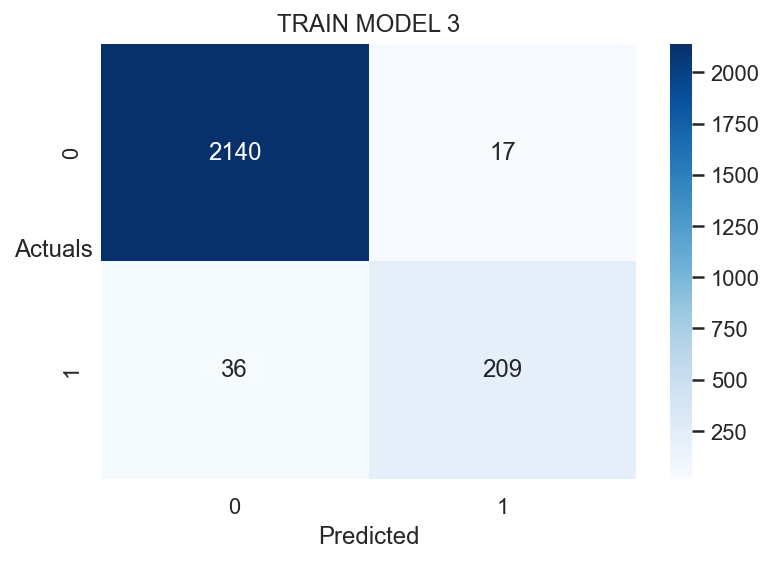

In [110]:
## MODEL 3 TRAIN

y_prob_pred_train = model_3.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 3')

print(metrics.classification_report(y_train,y_class_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      1042
         1.0       0.90      0.88      0.89       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.94      1184
weighted avg       0.97      0.97      0.97      1184



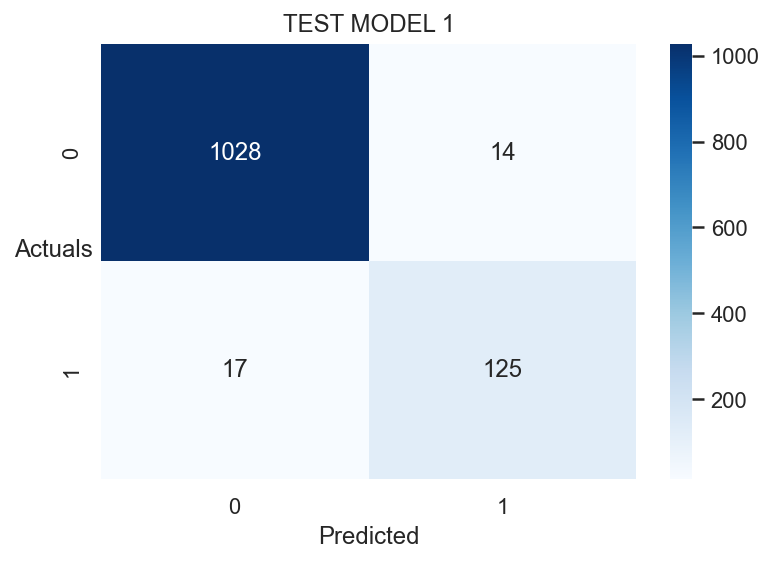

In [111]:
## MODEL 3 TEST

y_prob_pred_test = model_3.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 1')

print(metrics.classification_report(y_test,y_class_pred))

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, test_size = 0.33, random_state=42)

In [113]:
v = pd.DataFrame(model_3.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
v

,index,pvalue
0,Cash_Flow_From_Investing_Activities,9.629923e-01
1,Cash_Flow_From_Financing_Activities,9.406686e-01
2,Value_of_Output_to_Gross_Block,9.193957e-01
3,ROG_PBT_perc,8.195509e-01
4,Cash_Flow_From_Operating_Activities,7.197220e-01
5,Adjusted_PAT,7.040353e-01
6,Net_Working_Capital,6.915001e-01
7,ROG_Net_Sales_perc,6.674742e-01
8,Other_Income,6.285819e-01
9,ROG_Cost_of_Production_perc,5.109167e-01


In [114]:
import time
start = time.time()

for i in range(23):
    model_4 = SM.Logit(y_train, X_train).fit()
    v = pd.DataFrame(model_4.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_train = X_train.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.065853
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065854
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065854
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065857
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065867
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065899
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065927
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.065967
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.066029
         Iterations 10
Optimization terminated successfully.
         Current function value: 0.

In [115]:
print(model_4.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2393
Method:                           MLE   Df Model:                            8
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                  0.7938
Time:                        19:00:11   Log-Likelihood:                -163.20
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                6.562e-266
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Selling_Cost                    0.3771      0.133      2.845      0.004       0.117       0.637
PBIDT                          -0.2783      0.082     -3.389      0.001      -0.

In [116]:
X_test = X_test[X_train.columns]

In [117]:
X_test.shape

(1184, 9)

In [118]:
X_test.columns

Index(['Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Total_Assets_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Book_Value_Adj_Unit_Curr'], dtype='object')

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.92      0.85      0.88       245

    accuracy                           0.98      2402
   macro avg       0.95      0.92      0.94      2402
weighted avg       0.98      0.98      0.98      2402



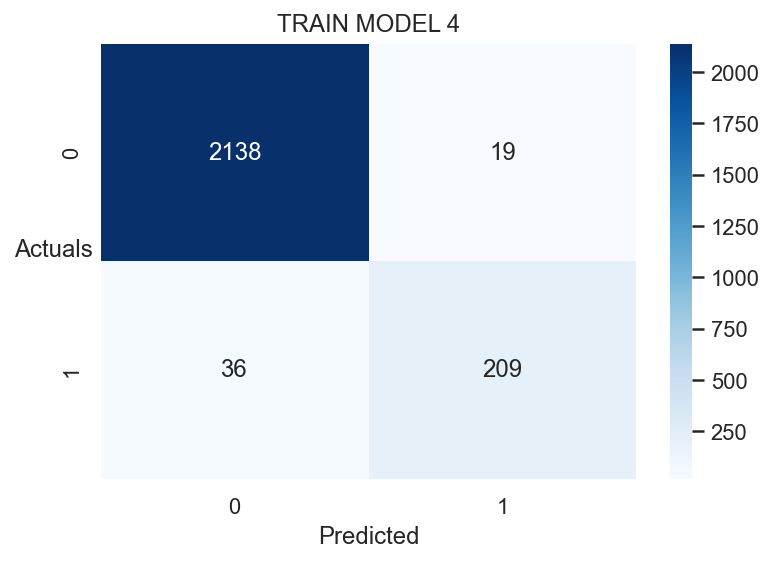

In [119]:
## MODEL 4 TRAIN

y_prob_pred_train = model_4.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 4')

print(metrics.classification_report(y_train,y_class_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.88      0.88       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



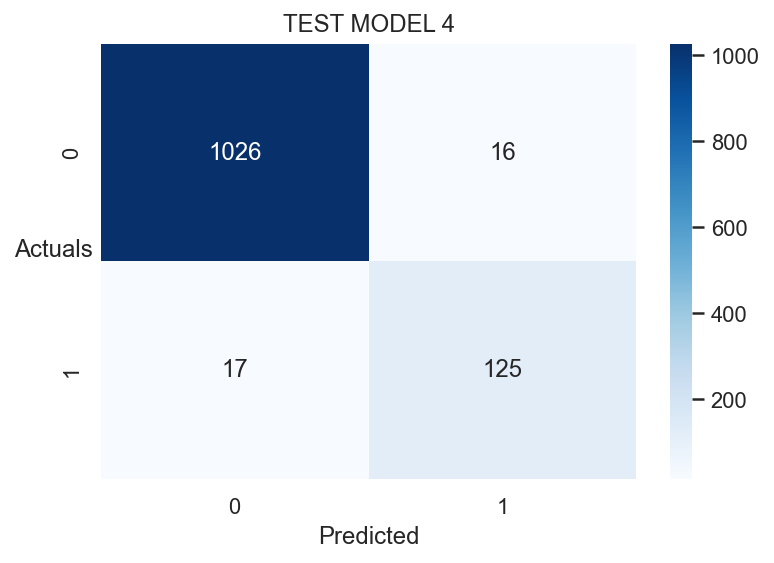

In [120]:
## MODEL 4 TEST

y_prob_pred_test = model_4.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 4')

print(metrics.classification_report(y_test,y_class_pred))

In [121]:
final_cols = X_train.columns
final_cols

Index(['Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Total_Assets_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Book_Value_Adj_Unit_Curr'], dtype='object')

In [122]:
data = pd.concat([X_train, y_train], axis=1)
data1 = pd.concat([X_test, y_test], axis=1)
data.shape

(2402, 10)

In [124]:
data1.shape

(1184, 10)

In [125]:
final_data = pd.concat([data, data1], axis=0)
final_data.shape

(3586, 10)

In [126]:
final_data.to_csv('final_data.csv')
final_data.to_excel('final_data.xlsx')

In [127]:
X_train.shape

(2402, 9)

In [128]:
grid={'penalty':['l2','none', 'l1'],
      'solver':['lbfgs', 'liblinear', 'sag', 'saga', 'newton-cg'],
      'tol':[0.0001,0.00001]}

In [129]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [130]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 10,n_jobs=-1,scoring='f1', verbose=True)

In [131]:
grid_search.fit(X_train, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


GridSearchCV(cv=10, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none', 'l1'],
                         'solver': ['lbfgs', 'liblinear', 'sag', 'saga',
                                    'newton-cg'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1', verbose=True)

In [132]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'none', 'solver': 'lbfgs', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2, penalty='none')


In [133]:
best_model = grid_search.best_estimator_

In [134]:
logit4_train_score = best_model.score(X_train, y_train)
logit4_test_score = best_model.score(X_test, y_test)
logit4_test_f1 = metrics.f1_score(y_test, best_model.predict(X_test))
logit4_test_f0 = metrics.f1_score(y_test, best_model.predict(X_test), pos_label=0)

print('Regularised Logistic Regression Train Score =', round(logit4_train_score, 4))
print('Regularised Logistic Regression Test Score =', round(logit4_test_score, 4))
print('Regularised Logistic Regression f1 Test Score for "1" =', round(logit4_test_f1, 4))
print('Regularised Logistic Regression f1 Test Score for "0" =', round(logit4_test_f0, 4))

Regularised Logistic Regression Train Score = 0.9771
Regularised Logistic Regression Test Score = 0.9721
Regularised Logistic Regression f1 Test Score for "1" = 0.8834
Regularised Logistic Regression f1 Test Score for "0" = 0.9842


In [135]:
print('TEST REGULARISED MODEL')
print('')
print(metrics.classification_report(y_test, best_model.predict(X_test)))

TEST REGULARISED MODEL

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.88      0.88       142

    accuracy                           0.97      1184
   macro avg       0.94      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



In [136]:
from sklearn.metrics import roc_curve

y_prob_pred_train = model_4.predict(X_train)
fpr, tpr, thresholds = roc_curve(y_train,y_prob_pred_train)

In [137]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.08409205000274865

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      2157
         1.0       0.71      0.95      0.81       245

    accuracy                           0.95      2402
   macro avg       0.85      0.95      0.89      2402
weighted avg       0.96      0.95      0.96      2402



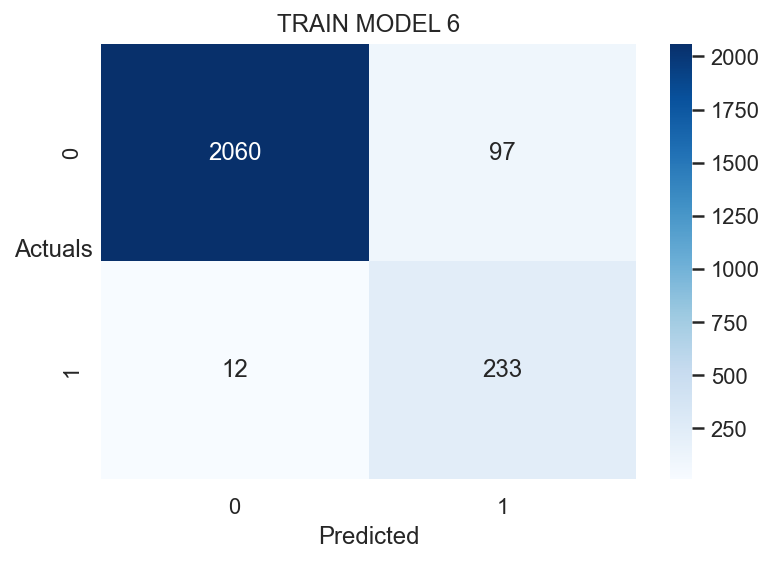

In [138]:
## MODEL 6 TRAIN

y_prob_pred_train = model_4.predict(X_train)

y_class_pred=[]
for i in range(0,len(y_prob_pred_train)):
    if np.array(y_prob_pred_train)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_train,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TRAIN MODEL 6')

print(metrics.classification_report(y_train,y_class_pred))

              precision    recall  f1-score   support

         0.0       0.99      0.95      0.97      1042
         1.0       0.71      0.95      0.81       142

    accuracy                           0.95      1184
   macro avg       0.85      0.95      0.89      1184
weighted avg       0.96      0.95      0.95      1184



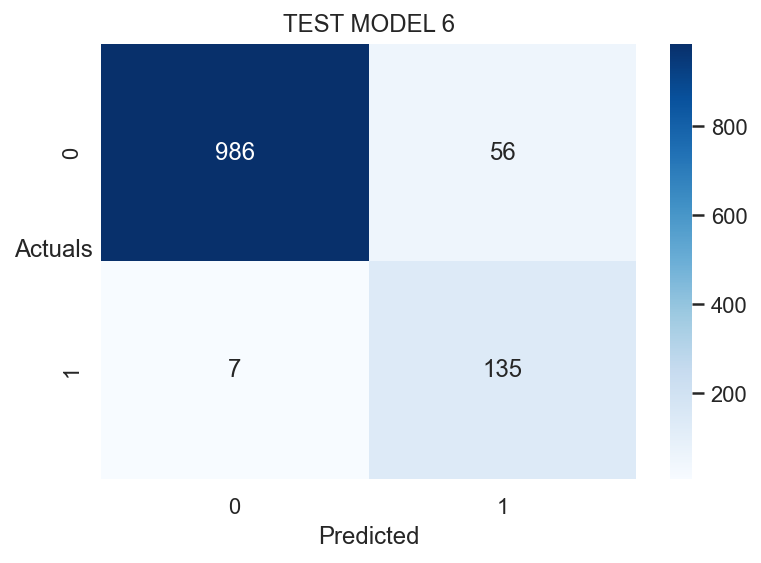

In [139]:
## MODEL 6 TEST

y_prob_pred_test = model_4.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 6')

print(metrics.classification_report(y_test,y_class_pred))

In [140]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, 
                                                    test_size = 0.33, random_state=42)


#### For modeling we will use Logistic Regression with recursive feature elimination
from sklearn.feature_selection import RFE

LogR = LogisticRegression()

selector = RFE(estimator = LogR, n_features_to_select=15, step=1)

selector = selector.fit(X_train, y_train)

df = pd.DataFrame({'Feature': X.columns, 'Rank': selector.ranking_})

In [141]:
df.sort_values(by='Rank')

,Feature,Rank
0,Other_Income,1
20,Value_of_Output_to_Gross_Block,1
19,Value_of_Output_to_Total_Assets,1
18,APATM_perc_Latest,1
17,Interest_Cover_Ratio_Latest,1
16,Current_Ratio_Latest,1
15,ROG_CP_perc,1
13,ROG_PBIDT_perc,1
12,ROG_Total_Assets_perc,1
22,Book_Value_Adj_Unit_Curr,1


In [142]:
pred_train = selector.predict(X_train)
pred_test = selector.predict(X_test)

print(confusion_matrix(y_train, pred_train))

print(classification_report(y_train, pred_train))

[[2140   17]
 [  33  212]]
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99      2157
         1.0       0.93      0.87      0.89       245

    accuracy                           0.98      2402
   macro avg       0.96      0.93      0.94      2402
weighted avg       0.98      0.98      0.98      2402



In [143]:
print(confusion_matrix(y_test, pred_test))

print(classification_report(y_test, pred_test))

[[1026   16]
 [  18  124]]
              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98      1042
         1.0       0.89      0.87      0.88       142

    accuracy                           0.97      1184
   macro avg       0.93      0.93      0.93      1184
weighted avg       0.97      0.97      0.97      1184



In [145]:
df = df[df['Rank'] == 1]

l = df['Feature'].values
list(l)


['Other_Income',
 'Selling_Cost',
 'PBIDT',
 'ROG_Net_Worth_perc',
 'ROG_Capital_Employed_perc',
 'ROG_Gross_Block_perc',
 'ROG_Total_Assets_perc',
 'ROG_PBIDT_perc',
 'ROG_CP_perc',
 'Current_Ratio_Latest',
 'Interest_Cover_Ratio_Latest',
 'APATM_perc_Latest',
 'Value_of_Output_to_Total_Assets',
 'Value_of_Output_to_Gross_Block',
 'Book_Value_Adj_Unit_Curr']

In [146]:
X = X[l]
X.columns

Index(['Other_Income', 'Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc', 'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc', 'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_CP_perc', 'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest', 'APATM_perc_Latest', 'Value_of_Output_to_Total_Assets', 'Value_of_Output_to_Gross_Block', 'Book_Value_Adj_Unit_Curr'], dtype='object')

In [147]:
X.shape

(3586, 15)

In [148]:
X_train, X_test, y_train, y_test = train_test_split(X, df_y, test_size = 0.33, random_state=42)

In [149]:
X_train.shape

(2402, 15)

In [151]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [152]:
selector_smote = selector.fit(X_res, y_res)

In [153]:
selector_smote.n_features_

15

In [154]:
smote_model8 = pd.DataFrame({'Feature': X_train.columns, 'Rank': selector_smote.ranking_})
smote_model8 = smote_model8[smote_model8['Rank'] == 1]
smote_model8

,Feature,Rank
0,Other_Income,1
1,Selling_Cost,1
2,PBIDT,1
3,ROG_Net_Worth_perc,1
4,ROG_Capital_Employed_perc,1
5,ROG_Gross_Block_perc,1
6,ROG_Total_Assets_perc,1
7,ROG_PBIDT_perc,1
8,ROG_CP_perc,1
9,Current_Ratio_Latest,1


In [155]:
smote_model8.to_csv('smote_model8.csv')

In [156]:
l = smote_model8['Feature'].values
list(l)
l

array(['Other_Income', 'Selling_Cost', 'PBIDT', 'ROG_Net_Worth_perc',
       'ROG_Capital_Employed_perc', 'ROG_Gross_Block_perc',
       'ROG_Total_Assets_perc', 'ROG_PBIDT_perc', 'ROG_CP_perc',
       'Current_Ratio_Latest', 'Interest_Cover_Ratio_Latest',
       'APATM_perc_Latest', 'Value_of_Output_to_Total_Assets',
       'Value_of_Output_to_Gross_Block', 'Book_Value_Adj_Unit_Curr'],
      dtype=object)

In [157]:
data15 = X[l]
data15['default'] = df_y
data15_orig = df_imputed[l]
data15_orig['default'] = df_y

data15.to_csv('data15.csv')
data15_orig.to_csv('data15_orig.csv')

In [158]:
df_orig_new = df_orig.copy()
df_orig_new = df_orig_new[l]
df_orig_new['default'] = df_y
df_orig_new.to_csv('df_orig15.csv')

In [159]:
pred_train_smote = selector_smote.predict(X_res)
pred_test_smote = selector_smote.predict(X_test)

In [160]:
print(classification_report(y_res, pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.96      0.97      0.97      2157
         1.0       0.97      0.96      0.97      2157

    accuracy                           0.97      4314
   macro avg       0.97      0.97      0.97      4314
weighted avg       0.97      0.97      0.97      4314



In [161]:
print(classification_report(y_test, pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      1042
         1.0       0.78      0.95      0.86       142

    accuracy                           0.96      1184
   macro avg       0.89      0.96      0.92      1184
weighted avg       0.97      0.96      0.96      1184



In [162]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_8 = SM.Logit(y_res, X_res).fit()
print(model_8.summary())

Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4299
Method:                           MLE   Df Model:                           14
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                  0.8579
Time:                        19:19:45   Log-Likelihood:                -424.87
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Other_Income                        0.3180      0.101      3.145  

In [163]:
LRresult1 = (model_8.summary().tables[1])
LRresult1 = pd.DataFrame(LRresult1)
LRresult1.to_csv('model_8_summary.csv')

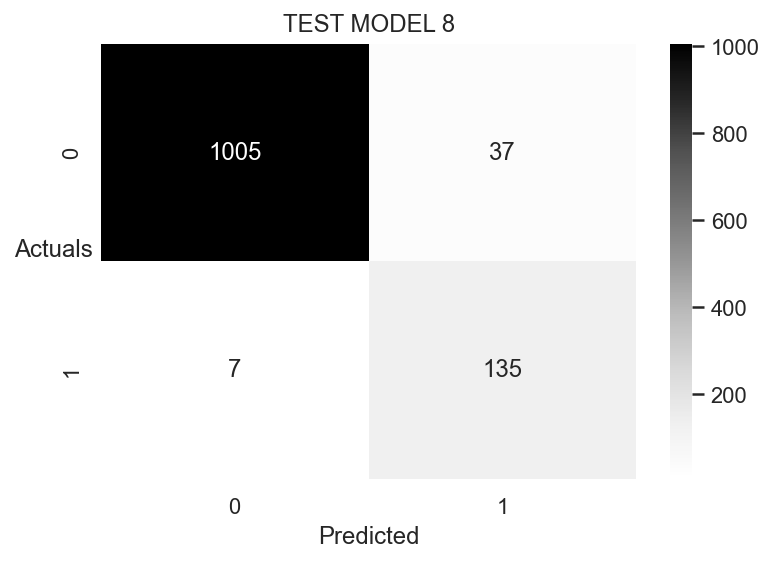

In [164]:
## MODEL 8 TEST

sns.heatmap((metrics.confusion_matrix(y_test,pred_test_smote)),annot=True,fmt='.5g'
            ,cmap='Greys');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 8')
plt.savefig('model8_cm.jpg', bbox_inches='tight');


In [165]:
print(metrics.classification_report(y_test,pred_test_smote))

cr = classification_report(y_test, pred_test_smote, output_dict=True)
cr = pd.DataFrame(cr).T
cr.to_csv('cr.csv')

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.98      1042
         1.0       0.78      0.95      0.86       142

    accuracy                           0.96      1184
   macro avg       0.89      0.96      0.92      1184
weighted avg       0.97      0.96      0.96      1184



In [166]:
selector_smote.predict_proba(X_res)

array([[9.89099942e-01, 1.09000581e-02],
       [9.99459901e-01, 5.40099233e-04],
       [9.25872325e-01, 7.41276754e-02],
       ...,
       [3.25320052e-02, 9.67467995e-01],
       [8.21928397e-05, 9.99917807e-01],
       [1.22675352e-03, 9.98773246e-01]])

In [167]:
from sklearn.metrics import roc_curve

y_prob_pred_train = selector_smote.predict_proba(X_res)[:,1]
y_prob_pred_test = selector_smote.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_res,y_prob_pred_train)

In [168]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.42463211875598716

In [169]:
y_prob_pred_test

array([0.01127219, 0.00159853, 0.20162513, ..., 0.01332857, 0.00097907,
       0.00378365])

              precision    recall  f1-score   support

         0.0       0.99      0.96      0.97      1042
         1.0       0.75      0.95      0.84       142

    accuracy                           0.96      1184
   macro avg       0.87      0.95      0.90      1184
weighted avg       0.96      0.96      0.96      1184



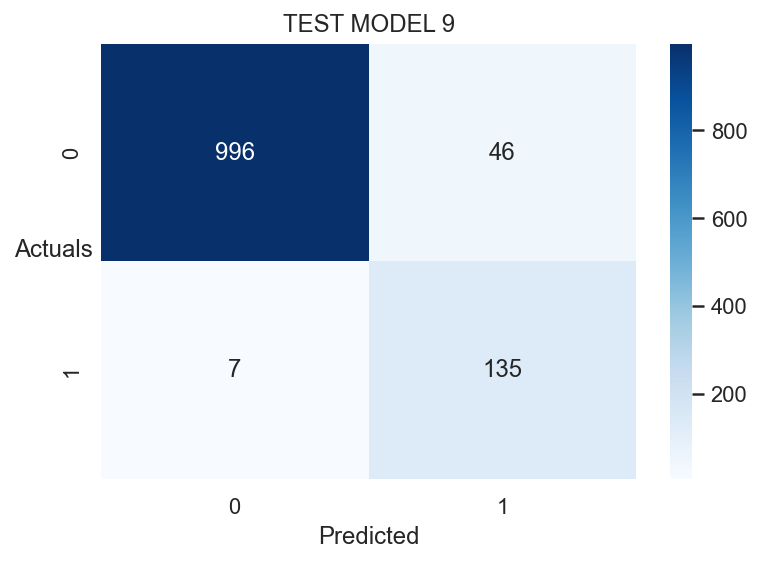

In [170]:
y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>optimal_threshold:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 9')

print(metrics.classification_report(y_test,y_class_pred))

In [171]:
import statsmodels.api as SM

# f1 = 'default ~ Equity_Paid_Up + Total_Debt + Other_Income + Selling_Cost + Adjusted_PAT + CEPS_annualised_Unit_Curr + Cash_Flow_From_Investing_Activities + Cash_Flow_From_Financing_Activities + Cash_Flow_From_Operating_Activities + ROG-Capital_Employed_perc + ROG-Gross_Block_perc + ROG-Net_Sales_perc + ROG-Cost_of_Production_perc + ROG-PAT_perc + Current_Ratio_Latest + Debtors_Ratio_Latest + Total_Asset_Turnover_Ratio_Latest + Interest_Cover_Ratio_Latest + PBIDTM_perc_Latest + CPM_perc_Latest + Debtors_Velocity_Days + Creditors_Velocity_Days + Value_of_Output_to_Total_Assets + Value_of_Output_to_Gross_Block + Gross_Block + Net_Working_Capital + Current_Assets + Book_Value_Adj_Unit_Curr'
model_9 = SM.Logit(y_res, X_res).fit()
print(model_9.summary())

Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4299
Method:                           MLE   Df Model:                           14
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                  0.8579
Time:                        19:23:09   Log-Likelihood:                -424.87
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Other_Income                        0.3180      0.101      3.145  

In [172]:
LRresult = (model_9.summary().tables[1])
LRresult = pd.DataFrame(LRresult)
LRresult.to_csv('model_9_summary.csv')
LRresult

,0,1,2,3,4,5,6
0,,coef,std err,z,P>|z|,[0.025,0.975]
1,Other_Income,0.3180,0.101,3.145,0.002,0.120,0.516
2,Selling_Cost,0.6835,0.119,5.754,0.000,0.451,0.916
3,PBIDT,-0.3132,0.056,-5.553,0.000,-0.424,-0.203
4,ROG_Net_Worth_perc,-0.4148,0.049,-8.388,0.000,-0.512,-0.318
5,ROG_Capital_Employed_perc,0.4119,0.054,7.656,0.000,0.306,0.517
6,ROG_Gross_Block_perc,0.0368,0.047,0.790,0.429,-0.055,0.128
7,ROG_Total_Assets_perc,-0.2154,0.055,-3.939,0.000,-0.323,-0.108
8,ROG_PBIDT_perc,0.2171,0.057,3.835,0.000,0.106,0.328
9,ROG_CP_perc,-0.1513,0.057,-2.677,0.007,-0.262,-0.041


In [173]:
import time
start = time.time()

for i in range(23):
    model_10 = SM.Logit(y_res, X_res).fit()
    v = pd.DataFrame(model_10.pvalues.sort_values(ascending=False), columns=['pvalue']).reset_index()
    if (v.iloc[0,1] > 0.05):
        X_res = X_res.drop(columns=v.iloc[0,0])

end = time.time()
print('Time taken =', end-start)

Optimization terminated successfully.
         Current function value: 0.098486
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098510
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
         Iterations 9
Optimization terminated successfully.
         Current function value: 0.098570
  

In [174]:
print(model_10.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4301
Method:                           MLE   Df Model:                           12
Date:                Wed, 04 Jan 2023   Pseudo R-squ.:                  0.8578
Time:                        19:23:51   Log-Likelihood:                -425.23
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Other_Income                       0.3276      0.100      3.278      0.001       0.132       0.523
Selling_Cost                       0.6835      0.115      5.937      0.

In [177]:
LRresult1 = (model_10.summary().tables[1])
LRresult1 = pd.DataFrame(LRresult1)
# LRresult1.to_csv('model_9_summary.csv')

In [176]:
X_test.drop(['Value_of_Output_to_Total_Assets', 'ROG_Gross_Block_perc'], axis=1, inplace=True)
X_test.shape

(1184, 13)

              precision    recall  f1-score   support

         0.0       0.99      0.97      0.98      1042
         1.0       0.78      0.92      0.85       142

    accuracy                           0.96      1184
   macro avg       0.89      0.94      0.91      1184
weighted avg       0.96      0.96      0.96      1184



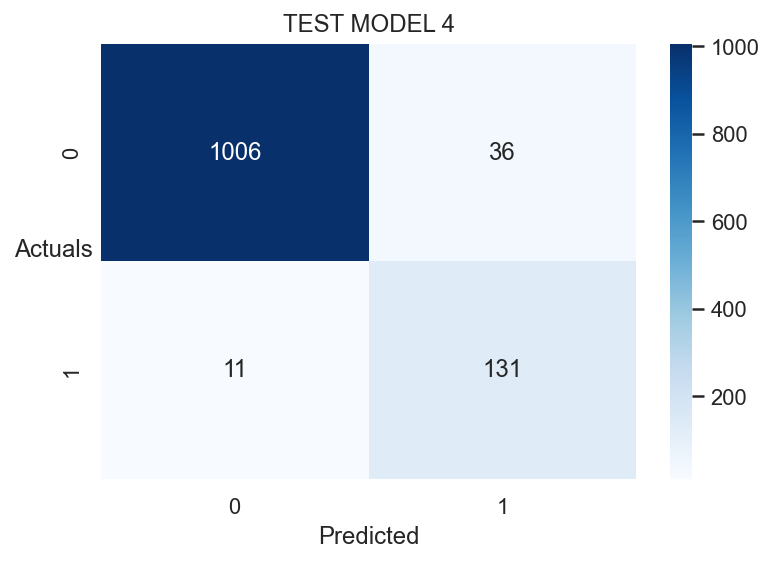

In [178]:
## MODEL 10 TEST

y_prob_pred_test = model_10.predict(X_test)

y_class_pred=[]
for i in range(0,len(y_prob_pred_test)):
    if np.array(y_prob_pred_test)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

from sklearn import metrics

sns.heatmap((metrics.confusion_matrix(y_test,y_class_pred)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);
plt.title('TEST MODEL 4')

print(metrics.classification_report(y_test,y_class_pred))

In [181]:
comp = pd.read_csv('df_orig15.csv')
scaled_comp = pd.read_csv('data15.csv')

In [182]:
comp.drop('Unnamed: 0', axis=1, inplace=True)
scaled_comp.drop('Unnamed: 0', axis=1, inplace=True)
comp.head()

,Other_Income,Selling_Cost,PBIDT,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Book_Value_Adj_Unit_Curr,default
0,7.60,0.00,-179.06,-15.31,-20.76,-9.75,-25.75,5.23,-19.29,0.02,-0.20,0.00,0.00,0.00,-167.58,1.0
1,46.27,40.51,646.46,-26.15,6.30,3.17,6.66,5.24,-108.77,0.08,-0.84,-87.18,0.31,0.24,-15.18,1.0
2,9.55,54.83,-281.92,-61.86,15.66,-2.07,-0.78,-169.69,-642.67,1.06,-2.21,-7961.51,-0.03,-0.26,94.14,1.0
3,223.85,3.34,-213.01,-450.67,-40.84,-1.80,-10.12,-203.84,-88.52,0.09,-0.16,-51.58,0.24,1.90,-39.64,1.0
4,9.82,1.97,-647.86,-559.83,-11.76,0.34,-5.81,-40.07,-1.13,0.50,-0.73,274.79,0.01,0.05,-212.89,1.0


In [183]:
scaled_comp.head()

,Other_Income,Selling_Cost,PBIDT,ROG_Net_Worth_perc,ROG_Capital_Employed_perc,ROG_Gross_Block_perc,ROG_Total_Assets_perc,ROG_PBIDT_perc,ROG_CP_perc,Current_Ratio_Latest,Interest_Cover_Ratio_Latest,APATM_perc_Latest,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,Book_Value_Adj_Unit_Curr,default
0,3.0,0.492,-3.0,-3.0,-3.0,-3.00,-3.00,3.0,-3.00,0.02,-0.20,-3.0,0.911,3.00,-3.0,1.0
1,3.0,3.000,3.0,-3.0,3.0,3.00,3.00,3.0,-3.00,0.08,-0.84,-3.0,0.310,0.24,-3.0,1.0
2,3.0,3.000,-3.0,-3.0,3.0,-2.07,-0.78,-3.0,-3.00,1.06,-2.21,-3.0,-0.030,-0.26,3.0,1.0
3,3.0,3.000,-3.0,-3.0,-3.0,-1.80,-3.00,-3.0,-3.00,0.09,-0.16,-3.0,0.240,1.90,-3.0,1.0
4,3.0,1.970,-3.0,-3.0,-3.0,0.34,-3.00,-3.0,-1.13,0.50,-0.73,3.0,0.010,0.05,-3.0,1.0


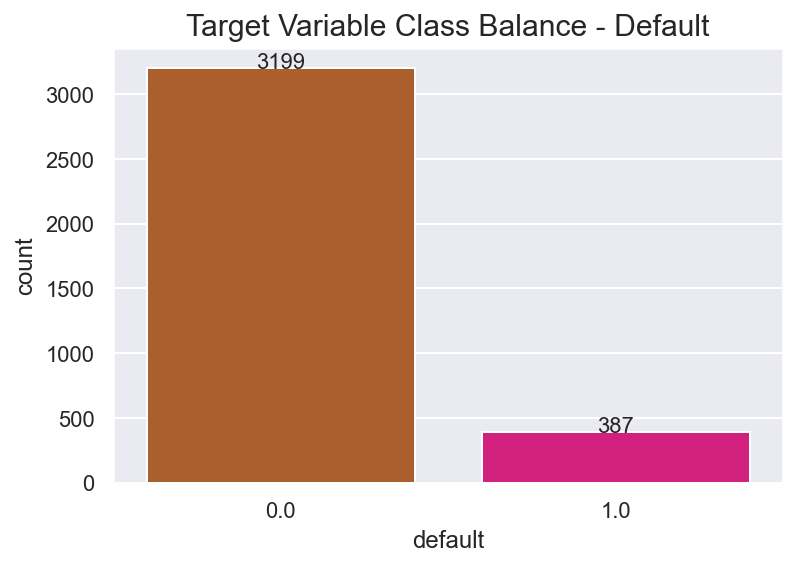

In [184]:
countplt, ax = plt.subplots()
ax =sns.countplot(comp['default'] );


# show count (+ annotate)
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width()  / 2,rect.get_height()+ 0.75,rect.get_height(),horizontalalignment='center', fontsize = 11)
countplt

plt.title('Target Variable Class Balance - Default', fontsize=15);

plt.savefig('default_count.jpg', bbox_inches='tight');

<AxesSubplot:xlabel='default', ylabel='Book_Value_Adj_Unit_Curr'>

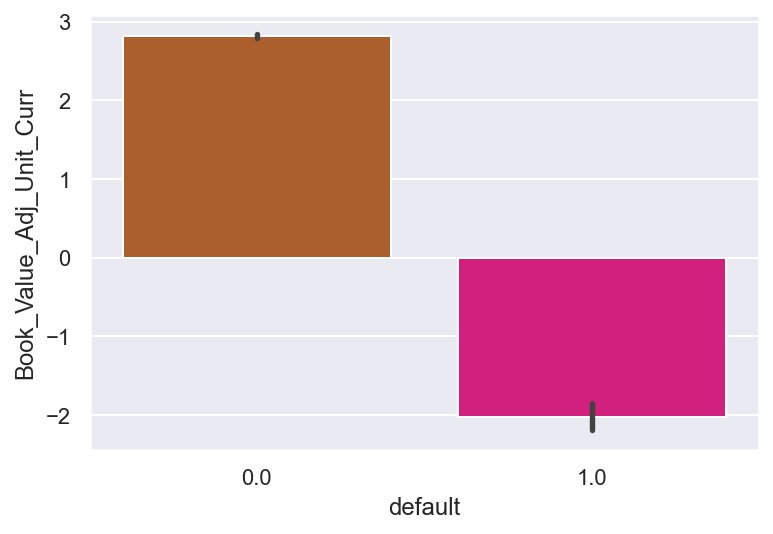

In [185]:
temp=scaled_comp.drop('default', axis=1)
sns.barplot(x=scaled_comp['default'], y=scaled_comp['Book_Value_Adj_Unit_Curr'])

In [186]:
grp_sc = scaled_comp.groupby('default').mean()

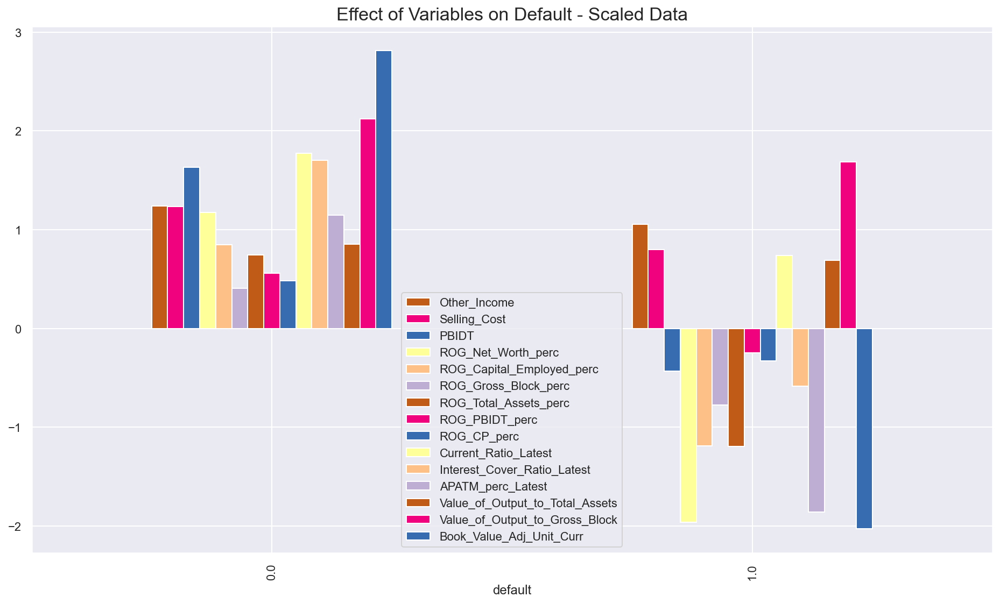

In [187]:
grp_sc.plot(kind='bar', figsize=(16,9))
plt.title('Effect of Variables on Default - Scaled Data', fontsize=17);
plt.savefig('vars_deault.jpg', bbox_inches='tight');

In [189]:
scaled_comp.shape

(3586, 16)

<AxesSubplot:>

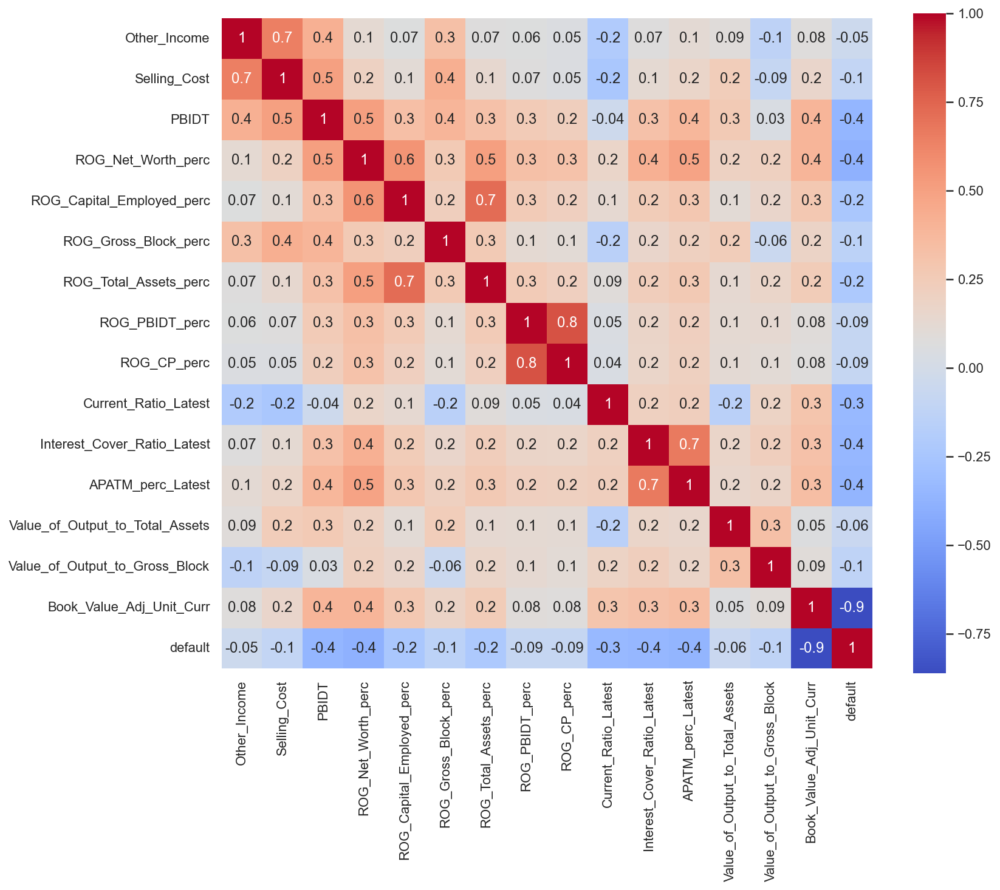

In [192]:
plt.figure(figsize=[12,10])
sns.heatmap(scaled_comp.corr(), annot=True, square=True, cmap='coolwarm', fmt='.1g')

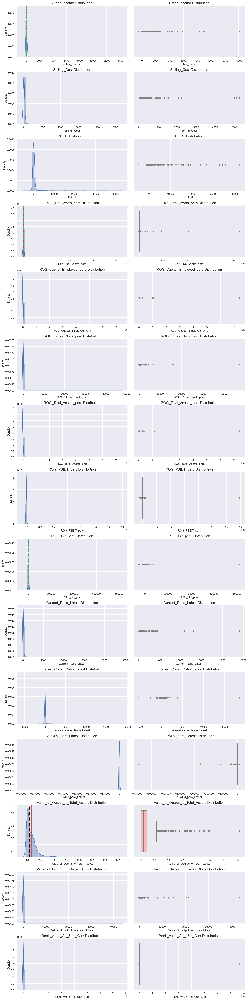

In [193]:
df = comp.drop('default', axis=1).copy()
cont=df.columns
fig, axes = plt.subplots(nrows=15,ncols=2);

fig.set_size_inches(15, 60);

for i in range(0, len(cont)):
    a = sns.distplot(df[cont[i]], ax=axes[i][0], color='b');
    a.set_title('{} Distribution'.format(cont[i]), fontsize=15);
    
    a.axvline(df[cont[i]].mean(), color='r', linewidth=1);
    a.axvline(df[cont[i]].median(), color='black', linestyle='dashed', linewidth=1);
    a.axvline(df[cont[i]].mode()[0], color='g', linestyle='dashed', linewidth=1);
    
    a = sns.boxplot(df[cont[i]], orient = "v" , ax=axes[i][1], palette='Pastel1');
    a.set_title('{} Distribution'.format(cont[i]), fontsize=15);
    plt.tight_layout();

plt.savefig('df_Distribution.jpg', bbox_inches='tight');

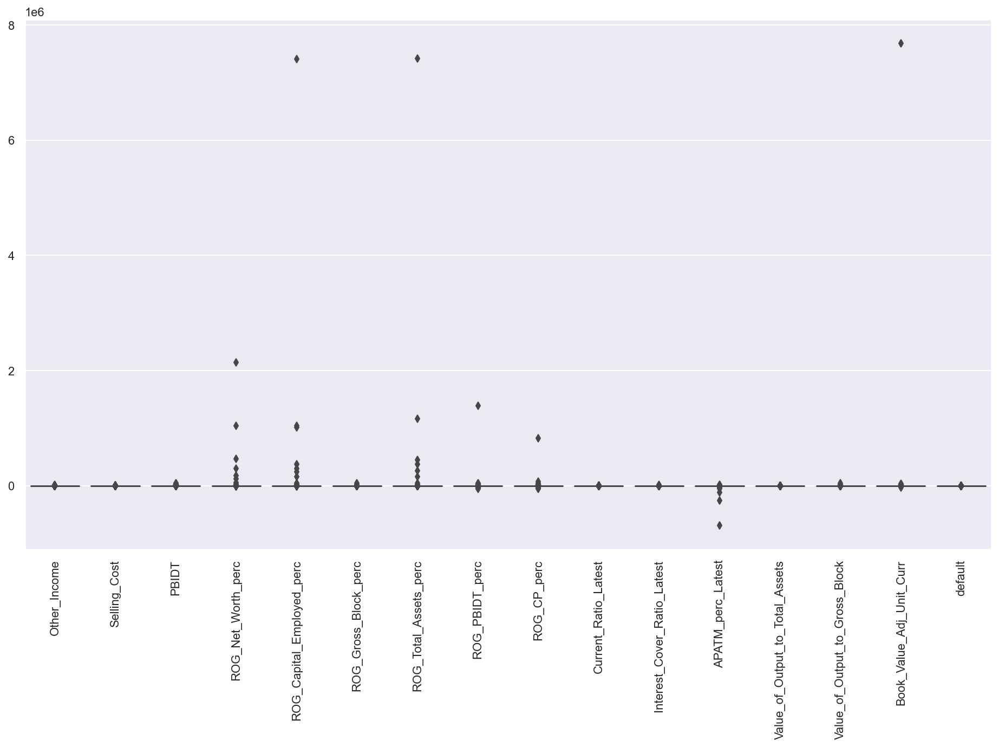

In [195]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp);
plt.xticks(rotation=90);

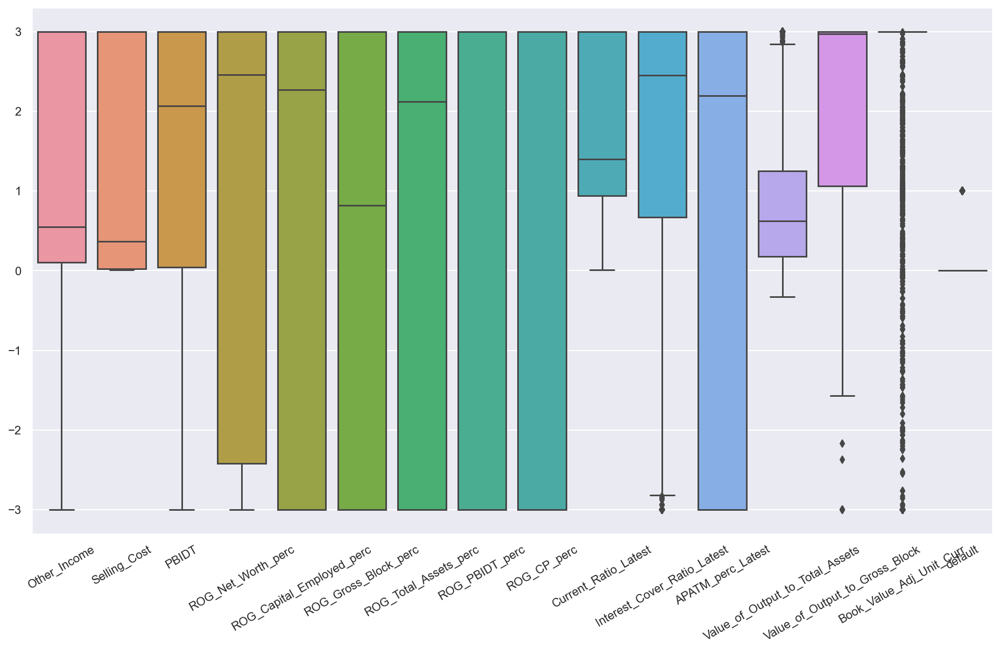

In [197]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=scaled_comp);
plt.xticks(rotation=30);

In [199]:
### <span style="font-family: Arial; font-weight:bold;font-size:1.2em;color:#9B59B6"> Outlier Treatment using IQR method

def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [200]:
comp_out = comp.copy()

for column in comp_out.columns:
    lr,ur=remove_outlier(comp_out[column])
    comp_out[column]=np.where(comp_out[column]>ur,ur,comp_out[column])
    comp_out[column]=np.where(comp_out[column]<lr,lr,comp_out[column])

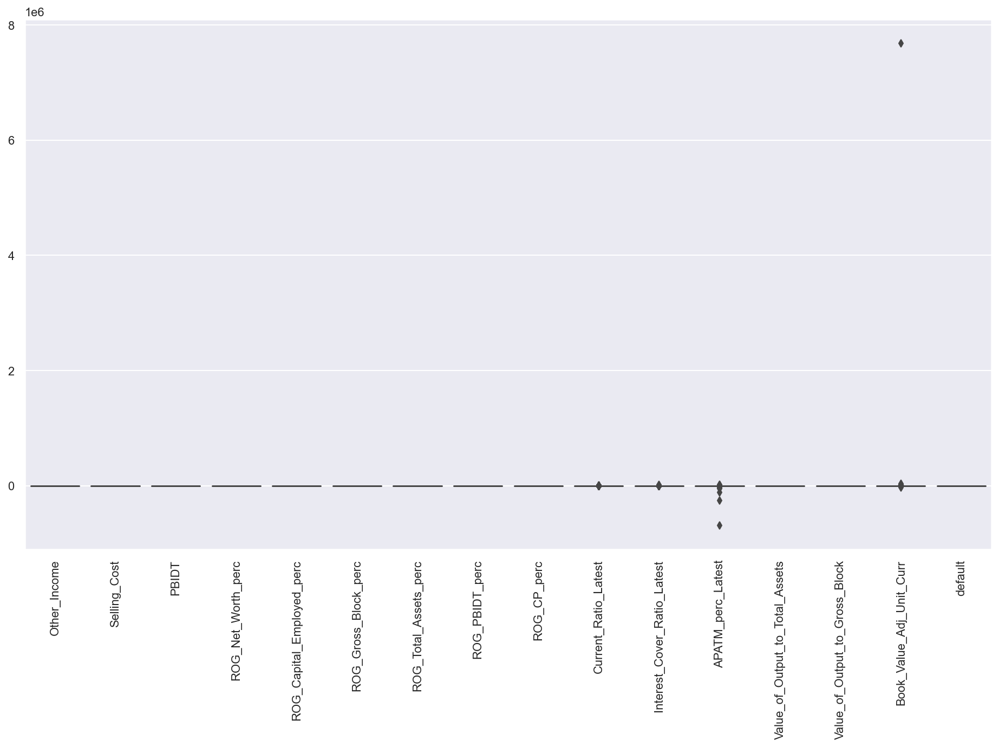

In [202]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_out);
plt.xticks(rotation=90);

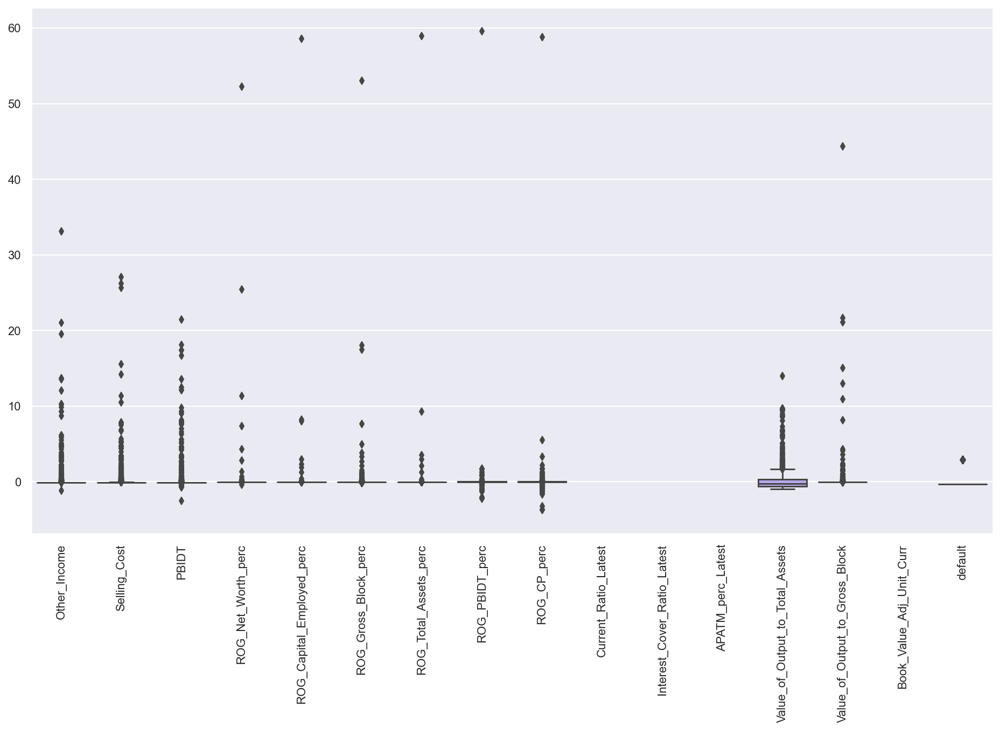

In [204]:
comp_scaled = comp.apply(zscore)

plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_scaled);
plt.xticks(rotation=90);

In [205]:
comp_out = comp_scaled.copy()

for column in comp_out.columns:
    lr,ur=remove_outlier(comp_out[column])
    comp_out[column]=np.where(comp_out[column]>ur,ur,comp_out[column])
    comp_out[column]=np.where(comp_out[column]<lr,lr,comp_out[column])

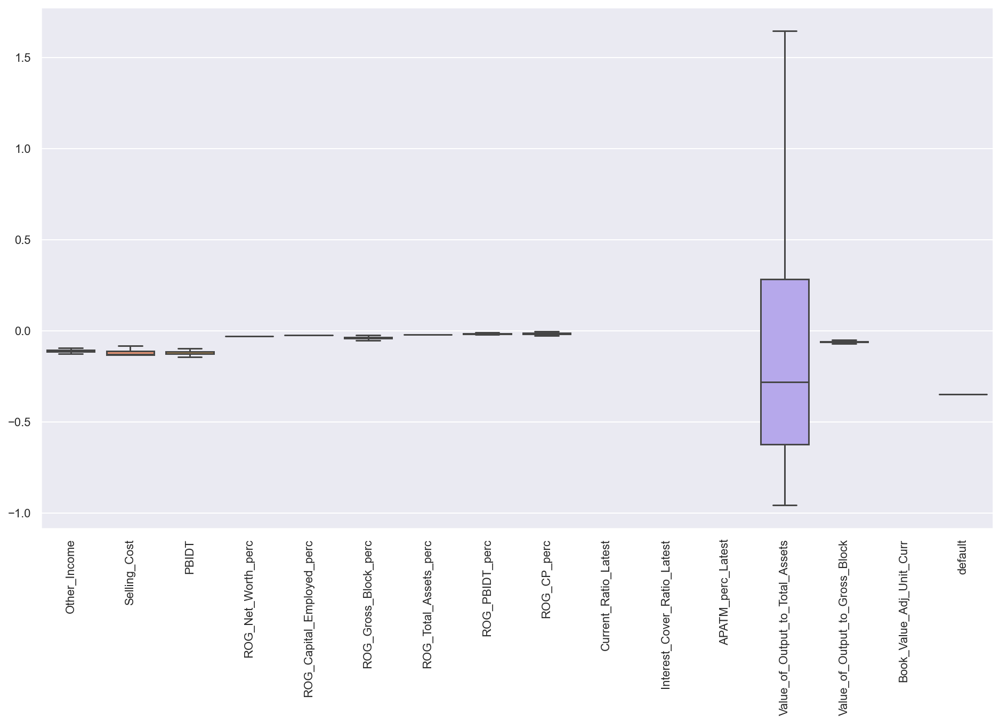

In [207]:
plt.figure(figsize=[16,9]);
sns.boxplot(data=comp_out);
plt.xticks(rotation=90);

### END